<img src="figs/TheOhioStateUniversity-Scarlet-Horiz-RGBHEX.png" 
        alt="Picture" 
        width="200" 
        style="display: block; margin: 0 auto" />

---

# Implementation and Analysis of Contextual Quantum Neural Networks for Multi-Asset Stock Price Prediction

**Author(s):** Anthony Yuhos    
**Project Category:** Quantum Machine Learning     
**Course:** Physics 5680, Autumn 2025  
**Date:** December 16, 2025

---

## Abstract

This project explores the application of Quantum Machine Learning (QML) to financial forecasting by implementing and evaluating the "Contextual Quantum Neural Network" (CQNN) proposed by Mourya et al. (2025). The primary motivation is to investigate QML's potential to model the complex, non-linear dynamics of stock market data more effectively than classical methods. Our methodology involves replicating the paper's Quantum Multi-Task Learning (QMTL) architecture, which utilizes a "share-and-specify ansatz" to simultaneously predict the price distributions of multiple assets. This report will detail our implementation of the quantum circuit, the "Quantum Batch Gradient Update" training technique, and an experimental analysis of the model's predictive accuracy and convergence speed using real-world financial data.

---

## 1. Introduction

Financial market prediction remains one of the most significant challenges in computational science due to the highly volatile, noisy, and non-stationary nature of stock price data. Traditional time-series models and classical machine learning algorithms often struggle to capture the complex, high-dimensional correlations between different assets and adapt to rapid shifts in market trends. These models can be computationally expensive and are often prone to overfitting or getting trapped in local optima.

Quantum Machine Learning (QML) presents a new paradigm for tackling these complex problems. By leveraging the principles of quantum mechanics, such as superposition and entanglement, quantum computers offer the potential to explore vast computational spaces and model intricate patterns that are intractable for classical machines. This potential for a quantum advantage is particularly promising in finance, where models must process large, correlated datasets to make accurate predictions.

A recent paper by Mourya et al., ["Contextual Quantum Neural Networks for Stock Price Prediction"](https://arxiv.org/abs/2503.01884) (Feb 2025), introduces a novel QML framework specifically designed for this task. Their approach moves beyond traditional models by focusing on recent market trends to predict future stock price distributions, rather than single point values. The core of their work is a "Contextual Quantum Neural Network" and a "Quantum Multi-Task Learning" (QMTL) architecture that allows for the simultaneous and efficient training of multiple assets on a single quantum circuit, representing a significant step forward in quantum finance.

Our algorithm receives a time-series of historical stock prices and context (which stock we are predicting). The raw output of our quantum circuit is a superposition of the stock going up or down, which is then measured many times to obtain a probability distribution for the price direction.

The objective of this project is to implement, train, and critically evaluate the contextual quantum neural network and QMTL architecture described by Mourya et al. We aim to replicate their findings by building the proposed quantum circuit, implementing simultaneous perturbation stochastic approximation for gradient calculation, and testing the model's performance on a dataset of multiple stocks. This report will detail our methodology, the experimental setup, the results of our training and validation, and a discussion of the model's effectiveness and potential limitations.

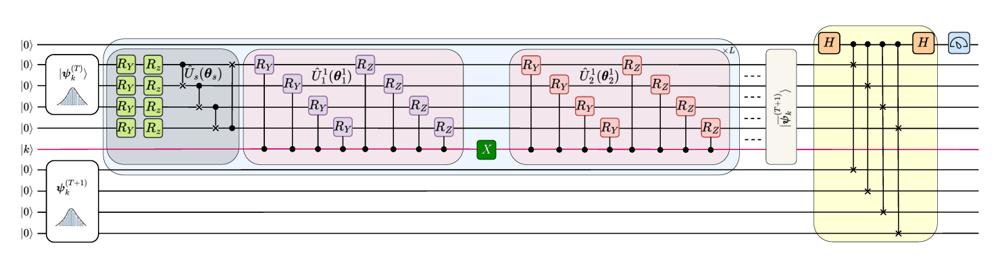

---

## 2. Related Work

The application of machine learning to financial forecasting has a rich history, but the emergence of Quantum Machine Learning (QML) presents a new frontier for tackling the complex, non-linear dynamics inherent in financial markets. Classical models often struggle to capture the intricate correlations and stochastic nature of stock price movements. QML, by leveraging principles like superposition and entanglement, offers a promising alternative for processing complex data with fewer resources.

Prior research in quantum finance has explored various applications, including options pricing , risk analysis , and time-series forecasting. Several QML architectures have been proposed, such as hybrid classical-quantum models , quantum recurrent neural networks (QRNNs) , and quantum generative adversarial networks (QGANs), to predict financial data. These models have demonstrated potential but are often focused on single-task learning (QSTL), predicting one asset at a time.

#### Hybrid Classical-Quantum Models:
Sim, S., Johnson, P. D., & Aspuru-Guzik, A. (2019). Expressibility and Entangling Capability of Parameterized Quantum Circuits for Hybrid Quantum-Classical Algorithms. Adv. Quantum Technol., 2(12), 1900070.

In hybrid-classical models, a classical computer handles tasks such as data pre-processing and post-processing. Most importantly, the classical computer runs the optimization algorithm, such as gradient descent. The quantum processor executes the part where it might offer an advantage, such as finding patterns in high-dimensional vector spaces or modeling complex correlations. The classical processor feeds the parameters to the quantum circuit, which is evaluated and the result is given back to the classical computer for parameter update.
The pros of hybrid classical-quantum models are that it is the only viable method to be used with our current quantum computation ability, since it only requires small, short bursts of computatation. It is also very versatile, since it can be effectively "plugged in" to any classical neural network. The classical parts of these models also make them more robust, avoiding some of the inherent noise of quantum hardware.
A con of hybrid models is the communication bottleneck that arises when sending information back and forth between the classical and quantum processor. Additionally, the design of these models is quite complex, because we must decide what parts are better for the quantum processor, and decide how to efficiently encode and decode classical data into quantum states.

#### Quantum Recurrent Neural Networks (QRNNs):
Tacchino, F., Cilluffo, D., Gherardini, S., Amico, M., Tiersch, M., & Barkoutsos, P. (2020). Quantum recurrent neural networks. npj Quantum Information, 6(1).

A QRNN is the quantum version of the recurrent neural network (RNN). An RNN is a neural network designed for sequential data through a "hidden state." In the QRNN, this hidden state is encoded by using the quantum state at the previous time step as an input for our current calculation.
The pros of QRNN's for stock pricing is that they are naturally useful for sequential prediction. In addition, the unitary nature of quantum operations can help mitigate the "vanishing gradient" issue which plagues classical RNNs.
Some cons of QRNNs include the high hardware demands, requiring mid-circuit measurements and qubit resets every time-step. Additionally, the sequential nature of QRNNs make parallelism impossible, significantly reducing computation time. They are also limited to quantum single-task learning (QSTL), only learning one stock per model. Implementing QRNNs on current hardware would be slow and noisy.

#### Quantum Generative Adversarial Networks (QGANs):
Lloyd, S., & Weedbrook, C. (2018). Quantum generative adversarial learning. Phys. Rev. Lett., 121, 040502.

QGANs are the quantum version of Generative Adversarial Networks (GAN), which pit a generator (creates fake data) against a discriminator (attempts to filter the fake from the real data) until it can no longer tell the difference. The 'quantum' feature of these models is simply implementing these entities with quantum circuits.
QGANs are theoretically very powerful at learning probability distributions rather than single-point predictions, especially with the correlations that classical computers struggle with.
However, QGANs are prone to training instability, just like classical GANs. Additionally, QGANs are generative, not predictive, meaning they may not be well-suited for sequential prediction. Some even argue that QGANs simply average the probability distribution rather than capturing its underlying patterns.

#### Our model: Contextual Quantum Neural Network (QCNN):
Our project is based directly on the work of Mourya et al. (2025), "Contextual Quantum Neural Networks for Stock Price Prediction". This paper introduces a novel framework that moves beyond traditional QSTL. The authors propose a Contextual Quantum Neural Network (CQNN) designed to capture recent market trends to predict future stock price distributions rather than single point values. This model aims to rectify some of the drawbacks of the models listed above by implementing Quantum Multi-task Learning (QMTL) where multiple stocks can be learned at once, as well as implementing hardware-efficient frameworks and algorithms to make training faster. The headline feature of this new model is Quantum Batch Gradient Update (QBGU), in which a full epoch of training can be accomplished in a single training step by taking advantage the linearity of quantum mechanics with a superposition of states.

Our work, therefore, focuses on implementing and evaluating this specific, state-of-the-art QMTL architecture, positioning it as a significant advancement over previous QSTL-based approaches in financial QML.

---

## 3. Ethical Considerations

The application of advanced QML models to stock market prediction carries significant ethical implications. While this project is an academic implementation, a real-world deployment of such a technology would require careful consideration of several key areas:

#### Model Transparency & Explainability:
QML models, much like classical deep learning models, often function as "black boxes." It can be extremely difficult to interpret why a model made a specific prediction. In finance, this lack of explainability is a major risk. Regulators and risk managers need to understand a model's decision-making process to vet it for compliance, fairness, and soundness, which is a significant challenge for complex quantum circuits.

#### Market Impact & Stability:
If a highly accurate QML predictive model became widely adopted by major financial institutions, it could lead to algorithmic "herding." If multiple models independently arrive at the same predictive signal, it could trigger massive, synchronized buy or sell orders, creating extreme market volatility, flash crashes, or destabilizing feedback loops that harm all market participants.

#### Access & Equity:
The development and operation of QML models require access to highly specialized and expensive quantum computing hardware, especially as this technology is not fully developed yet. This creates a high barrier to entry, potentially leading to a "quantum divide." Only large, well-resourced financial firms might be able to leverage this technology, giving them an insurmountable predictive advantage over smaller investors and retail traders, thereby increasing market inequality.


-----

## 4. Project Setup and Imports

*(This initial section is for setting up your project's environment. It includes importing the necessary Python libraries and documenting their versions to ensure your work is reproducible.)*

### 1.1. Key Libraries

Below is a brief description of the primary Python packages that will be used in this project.

  * **pandas:** Used for data manipulation and analysis. It provides powerful data structures, like the DataFrame, for handling and exploring structured data.
  * **numpy:** The fundamental package for scientific computing in Python. It provides support for large, multi-dimensional arrays and matrices, along with a collection of mathematical functions to operate on these arrays.
  * **matplotlib & seaborn:** These are libraries for data visualization. Matplotlib is a comprehensive library for creating static visualizations, while Seaborn provides a high-level interface for drawing attractive and informative statistical graphics.
  * **scikit-learn:** A primary machine learning library that provides simple and efficient tools for data mining and data analysis, including a wide range of classification, regression, and clustering algorithms.
  * **Plotly:** A graphing library used to create interactive, publication-quality visualizations.  This is especially useful for creating dynamic plots that allow for zooming, panning, and hovering to inspect data points.
  * **statsmodels** A dedicated Python library for rigorous statistical analysis, estimation, and inference. It provides a foundation for exploring data using classical statistical methods and econometric models. A primary strength is its comprehensive suite of tools for time series analysis.
  * **pytorch** A primary open-source deep learning framework. It provides powerful tensor computations with strong GPU acceleration (often described as a NumPy-on-GPU) and a robust automatic differentiation (autograd) engine, making it a go-to tool for building and training complex neural networks.
  * **pennylane** A library for quantum machine learning (QML) that unifies quantum hardware and simulators from different providers. It allows you to create quantum circuits that can be trained and differentiated, effectively treating quantum computers as part of a larger computational graph. It also interfaces directly with torch, making optimization algorithms easy to implement.
  * **yfinance** An open-source Python library that acts as a popular and convenient client for fetching historical market data from Yahoo Finance. It is not an official Yahoo API but has become the de facto tool for this purpose. It is primarily used to download datasets of historical stock prices (Open, High, Low, Close, and Adjusted Close), as well as volume, dividends, and stock splits for one or more tickers, returning the data neatly formatted as a pandas DataFrame.

In [1]:
# JUST AN EXAMPLE!!! Yours will probably be different!!

# Import all necessary libraries here
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import plotly.io as pio
import torch
import torch.nn as nn
import statsmodels
import sklearn
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, classification_report, matthews_corrcoef
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from itertools import product

import yfinance as yf
import pennylane as qml

import sys

# # Configure plots for readability
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 14

# Uncomment below to avoid using a CDN for plotly.js
pio.renderers.default = 'notebook'

print("Libraries imported successfully.")

Libraries imported successfully.



### 4.2. Version Information

*(To ensure that the results in this notebook can be reproduced, it is important to record the versions of the key libraries used. The code below will print the versions of Python and the packages listed above.)*



In [2]:
# Print version information
print(f"Python version: {sys.version}")
print(f"pandas version: {pd.__version__}")
print(f"numpy version: {np.__version__}")
print(f"matplotlib version: {mpl.__version__}")
print(f"seaborn version: {sns.__version__}")
print(f"plotly version: {plotly.__version__}")
print(f"torch version: {torch.__version__}")
print(f"statsmodels version: {statsmodels.__version__}")
print(f"scikit-learn version: {sklearn.__version__}")
print(f"pennylane version: {qml.__version__}")
print(f"yfinance version: {yf.__version__}")


Python version: 3.9.18 (main, Sep  4 2025, 00:00:00) 
[GCC 11.4.1 20231218 (Red Hat 11.4.1-3)]
pandas version: 2.3.3
numpy version: 2.0.2
matplotlib version: 3.9.4
seaborn version: 0.13.2
plotly version: 6.4.0
torch version: 2.8.0+cu128
statsmodels version: 0.14.5
scikit-learn version: 1.6.1
pennylane version: 0.38.0
yfinance version: 0.2.66


---

## 5. The Dataset

For our dataset, we download Yahoo Finance's (yfinance) daily stock prices for Apple (AAPL), Amazon (AMZN), Google (GOOG), and Microsoft (MSFT) from Jan 1, 2018 to December 31, 2023. We attempt to obtain the adjusted close price, which account for dividends and stock splits. However, if that is unsuccessful we take the close price. We then calculate the finite difference between consecutive stock prices, and perform a moving weekly average with a stride length of one to reveal the underlying trends.

### 5.1. Load and Preprocess Data

In [3]:
# 1. Define the tickers and date range
tickers = ['AAPL', 'MSFT', 'GOOG', 'AMZN']
start_date = '2018-01-01'
end_date = '2023-12-31' # yfinance includes the end date

# 2. Download the data
# This downloads all tickers at once into a multi-index DataFrame
try:
    data = yf.download(tickers, start=start_date, end=end_date)
    
    if data.empty:
        raise Exception("No data downloaded. Check tickers, date range, and internet connection.")

    print("Data downloaded successfully. Inspecting columns...")
    # print(data.columns) # Uncomment this for deep debugging

    # 3. We only care about the 'Adj Close' price
    # 'Adj Close' is better than 'Close' as it accounts 
    # for dividends and stock splits.
    
    # When downloading multiple tickers, yfinance returns a MultiIndex
    # The top level is the measure ('Adj Close', 'Close', etc.)
    # The KeyError means 'Adj Close' was not found as a top-level column.
    
    # Check if 'Adj Close' is in the top level of the columns
    if 'Adj Close' not in data.columns.get_level_values(0):
        print("Warning: 'Adj Close' not found in downloaded data columns.")
        print("Available top-level columns:", data.columns.get_level_values(0).unique())
        
        # As a fallback, try to use 'Close'
        if 'Close' in data.columns.get_level_values(0):
            print("Falling back to using 'Close' price.")
            df_close = data['Close']
        else:
            # If neither is present, we can't proceed
            raise Exception("'Adj Close' and 'Close' not found. Cannot proceed.")
    else:
        # This is the normal, expected path
        df_close = data['Adj Close']
    
    # 4. Save to a CSV
    df_close.to_csv('stock_prices.csv')
    
    print("\nData processed and saved successfully!")
    print(df_close.head())

except Exception as e:
    print(f"An error occurred: {e}")

/tmp/slurmtmp.42552770/ipykernel_4060073/645268703.py:9: FutureWarning:

YF.download() has changed argument auto_adjust default to True

[*********************100%***********************]  4 of 4 completed


Data downloaded successfully. Inspecting columns...
Available top-level columns: Index(['Close', 'High', 'Low', 'Open', 'Volume'], dtype='object', name='Price')
Falling back to using 'Close' price.

Data processed and saved successfully!
Ticker           AAPL       AMZN       GOOG       MSFT
Date                                                  
2018-01-02  40.341881  59.450500  52.853588  79.050369
2018-01-03  40.334854  60.209999  53.721081  79.418251
2018-01-04  40.522213  60.479500  53.915623  80.117264
2018-01-05  40.983574  61.457001  54.701229  81.110580
2018-01-08  40.831348  62.343498  54.934978  81.193344


In [4]:
#Plot stock prices
fig = px.line(df_close, title='Close Stock Prices')
fig.show()

In [4]:
# Compute finite difference
df_diff = df_close - df_close.shift(1)

df_diff = df_diff.dropna().reset_index(drop=True)

print(df_diff.head())

fig = px.line(df_diff, title='Finite Difference of Stock Pricing')
fig.show()

Ticker      AAPL      AMZN      GOOG      MSFT
0      -0.007027  0.759499  0.867493  0.367882
1       0.187359  0.269501  0.194542  0.699013
2       0.461361  0.977501  0.785606  0.993317
3      -0.152225  0.886497  0.233749  0.082764
4      -0.004677  0.291500 -0.033749 -0.055199


In [5]:
# Conduct moving average

# TODO: "Moving Average" over each week (window = 5), stride length = 1 day
WINDOW_MA = 5
df_diff_smoothed = df_diff.rolling(window=WINDOW_MA).mean().dropna()
print(f"\nApplied {WINDOW_MA}-day Moving Average for smoothing.")

print(df_diff_smoothed.head())

# Save to CSV
df_diff_smoothed.to_csv('smoothed_stock_differences.csv')

fig = px.line(df_diff_smoothed, title='Finite Difference of Stock Pricing (Smoothed)')
fig.show()


Applied 5-day Moving Average for smoothing.
Ticker      AAPL    AMZN      GOOG      MSFT
4       0.096958  0.6369  0.409528  0.417555
5       0.096487  0.5013  0.199802  0.270401
6       0.105386  0.6709  0.189777  0.178424
7       0.097894  0.7606  0.198808  0.259357
8       0.086184  0.5799  0.147098  0.012872


### 5.2. Exploratory Data Analysis (EDA)

In [7]:
# Let's examine the histogram of our price differences
for col in df_diff_smoothed.columns:
    fig = px.histogram(df_diff_smoothed, x=col, title=f"Smoothed Price Distributions of {col}")
    fig.show()

In [8]:
# Now let's look at kurtosis & skewness

all_skewness = df_diff_smoothed.skew()
all_kurtosis = df_diff_smoothed.kurt()

# --- Print the results ---
print("--- Skewness ---")
print(all_skewness)

print("\n--- Kurtosis ---")
print(all_kurtosis)

--- Skewness ---
Ticker
AAPL   -0.234072
AMZN   -0.354799
GOOG   -0.125479
MSFT   -0.252033
dtype: float64

--- Kurtosis ---
Ticker
AAPL    1.830489
AMZN    2.042014
GOOG    1.893375
MSFT    1.586126
dtype: float64


Our values of skewness and kurtosis are exactly what we would expect out of financial data. The negative skewness (left-skewed) implies that the market, while experiencing frequent small gains, is prone to large negative days (crashes). The high kurtosis (leptokurtic) demonstrates that we have a sharp peak and long tails, which means that extreme events are far more common than a normal distribution. This demonstrates the volatility of the stock market.

In [9]:

# Run the ADF (Augmented Dickey-Fuller) test to determine if data is stationary

for col in df_diff_smoothed.columns:
    adf_result = adfuller(df_diff_smoothed[col])

    # --- Print and Interpret the Results ---
    print(f"--- {col} ---")
    print(f'ADF Statistic: {adf_result[0]}')
    print(f'p-value: {adf_result[1]}')

--- AAPL ---
ADF Statistic: -7.709567198226668
p-value: 1.2745159572197945e-11
--- AMZN ---
ADF Statistic: -8.328343837974685
p-value: 3.42187411424496e-13
--- GOOG ---
ADF Statistic: -8.152577438935861
p-value: 9.607582399222432e-13
--- MSFT ---
ADF Statistic: -8.483014597527857
p-value: 1.376832908339925e-13


Our p-values for the ADF test are all miniscule, meaning we can safely reject the null and conclude that our data is STATIONARY, as expected

In [6]:
# convert to binary (which is what we will be using as our input) and check if it is predictive with ACF/PACF

df_diff_binary = (df_diff_smoothed > 0).astype(int)

print(df_diff_binary.head(15))

# Check how many are 1 vs. 0
for col in df_diff_binary.columns:
    print(df_diff_binary[col].value_counts(normalize=True))

Ticker  AAPL  AMZN  GOOG  MSFT
4          1     1     1     1
5          1     1     1     1
6          1     1     1     1
7          1     1     1     1
8          1     1     1     1
9          1     1     1     1
10         1     1     1     1
11         1     1     1     1
12         0     1     1     1
13         1     1     1     1
14         0     1     1     1
15         0     1     1     1
16         0     1     1     1
17         0     1     1     1
18         0     1     0     1
AAPL
1    0.59375
0    0.40625
Name: proportion, dtype: float64
AMZN
1    0.550532
0    0.449468
Name: proportion, dtype: float64
GOOG
1    0.573138
0    0.426862
Name: proportion, dtype: float64
MSFT
1    0.598404
0    0.401596
Name: proportion, dtype: float64


We note that there are always more 1's than 0's, which may affect training (although it is expected, since the stock market generally rises)

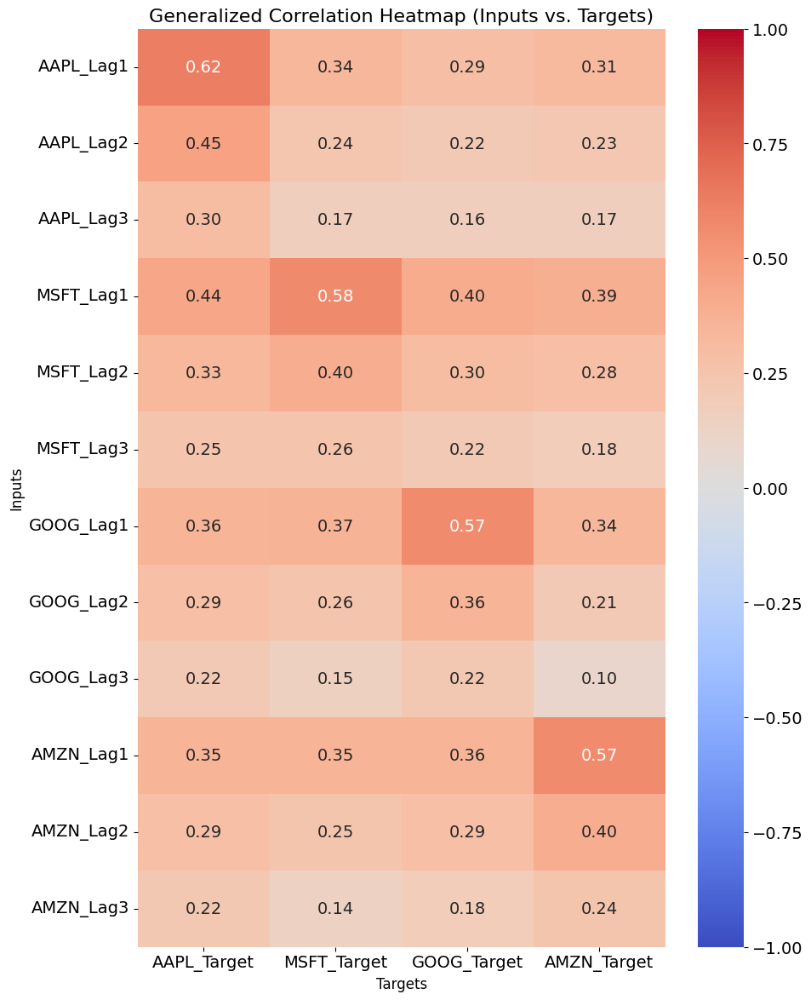

In [10]:
# Create a heatmap of autocorrelations and cross-correlations

# --- 2. Create the "Targets" and "Inputs" DataFrame ---
df_corr = pd.DataFrame() # Create a new, clean DataFrame

# First, define our target columns
for stock in tickers:
    df_corr[f'{stock}_Target'] = df_diff_binary[stock]

# Second, create all lagged input features
for stock in tickers:
    for lag in [1, 2, 3]:
        # We shift the *target* column to create the input
        df_corr[f'{stock}_Lag{lag}'] = df_corr[f'{stock}_Target'].shift(lag)

# --- 3. Define the Column Lists for the Heatmap ---
# This is the key to making the plot readable

# List of just the targets (for the x-axis)
target_cols = [f'{stock}_Target' for stock in tickers]

# List of all the inputs (for the y-axis)
input_cols = []
for stock in tickers:
    for lag in [1, 2, 3]:
        input_cols.append(f'{stock}_Lag{lag}')

# --- 4. Calculate and Subset the Correlation Matrix ---

# Drop NaNs created by shifting
df_clean = df_corr.dropna()

# Calculate the *full* correlation matrix
corr_matrix_full = df_clean.corr()

# --- This is the magic step ---
# Select *only* the part of the matrix we care about:
# Rows = Inputs, Columns = Targets
corr_subset = corr_matrix_full.loc[input_cols, target_cols]

# --- 5. Plot the Generalized Heatmap ---
plt.figure(figsize=(10, 14)) # Make it tall enough for all the inputs
sns.heatmap(
    corr_subset, 
    annot=True, 
    cmap='coolwarm', 
    vmin=-1, 
    vmax=1, 
    fmt='.2f' # Format annotations to 2 decimal places
)
plt.title('Generalized Correlation Heatmap (Inputs vs. Targets)', fontsize=16)
plt.xlabel('Targets', fontsize=12)
plt.ylabel('Inputs', fontsize=12)
plt.show()

As expected, the price differential of the same stock on the previous day correlated the most with the target value. It is also interesting to note how the other stocks are also strongly correlated, which also makes sense since each of these stocks are at the top of the S&P 500, in the Magnificent 7, probably impacted by similar things.

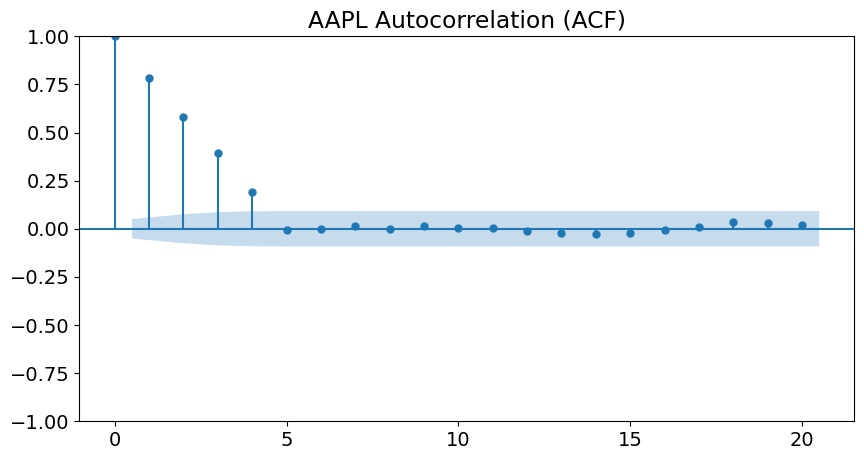

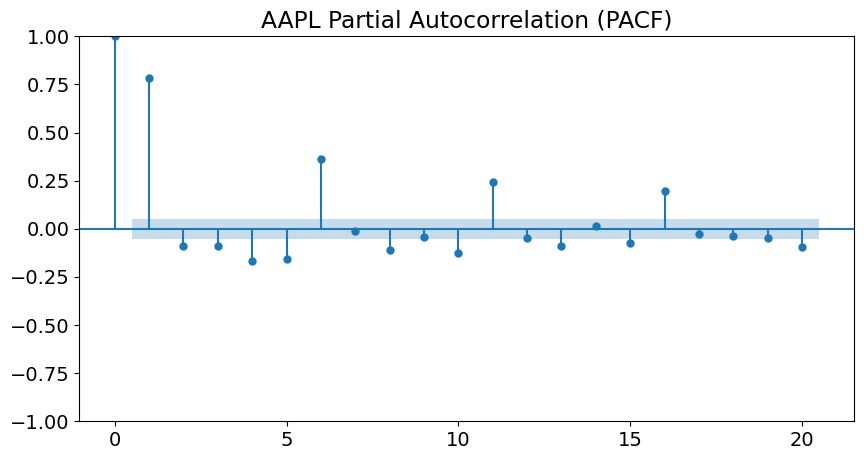

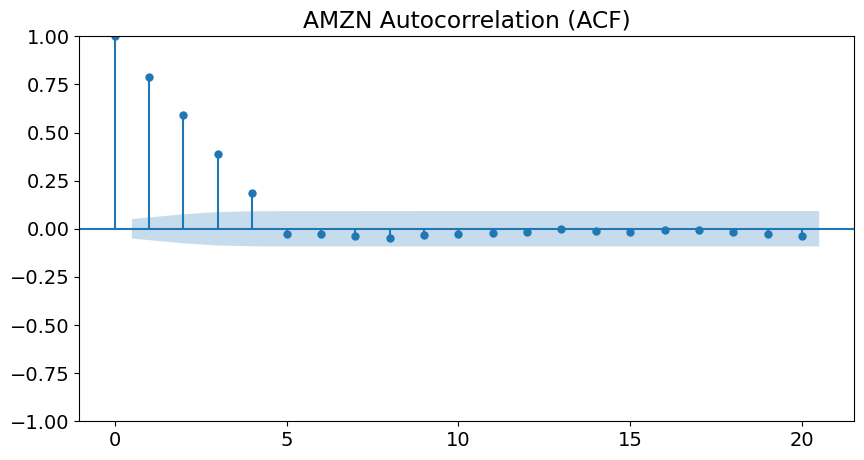

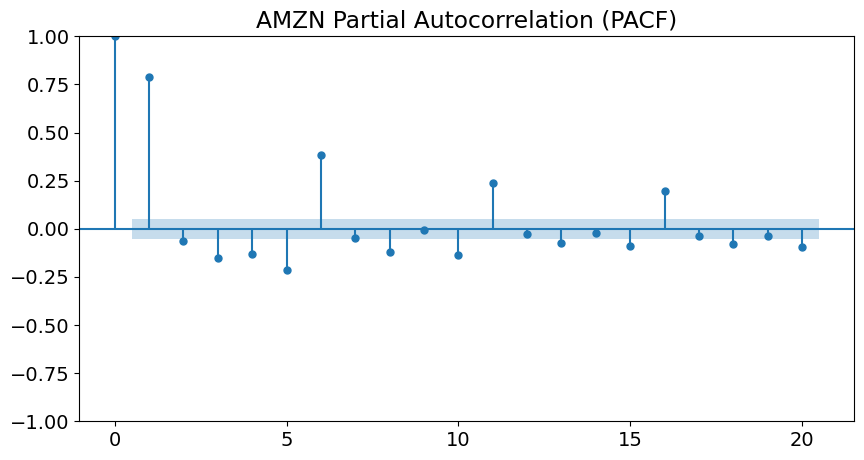

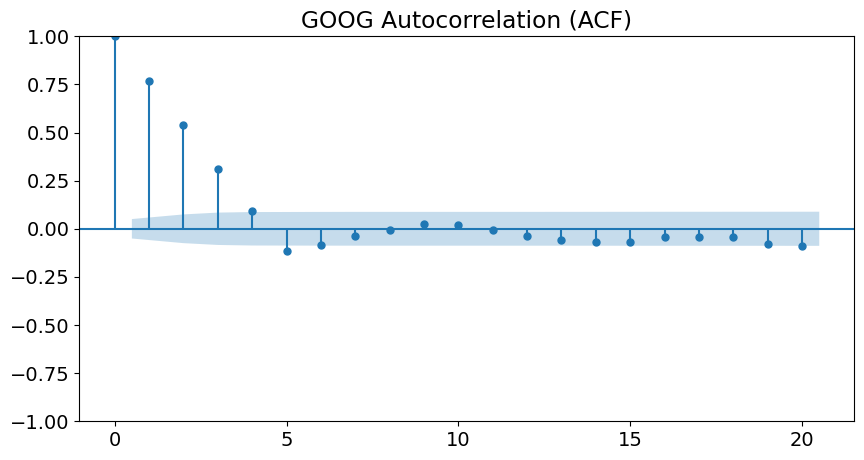

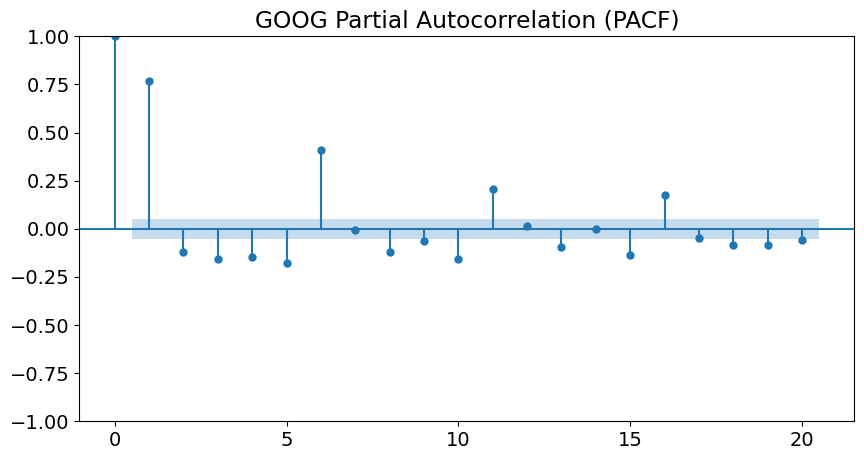

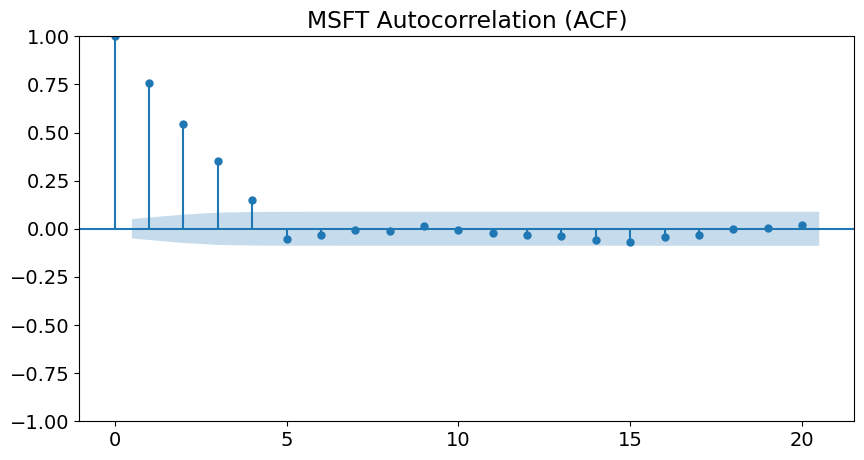

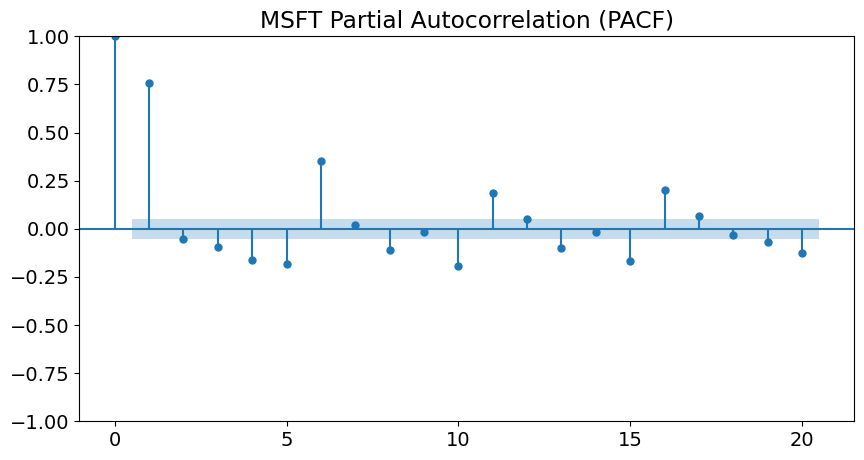

In [12]:
# Examine how the past 3 days effect the stock differential using ACF & PACF

for col in df_diff_binary.columns:
    # --- 1. Create the ACF Plot ---
    fig, ax1 = plt.subplots(1,1, figsize=(10, 5))
    plot_acf(df_diff_smoothed[col], lags=20, ax=ax1) # We check 20 lags
    ax1.set_title(f'{col} Autocorrelation (ACF)')
    
    # --- 2. Create the PACF Plot ---
    fig, ax2 = plt.subplots(1,1, figsize=(10, 5))
    plot_pacf(df_diff_smoothed[col], lags=20, ax=ax2) # We check 20 lags
    ax2.set_title(f'{col} Partial Autocorrelation (PACF)')

    plt.show()

The Auto-Correlation Function demonstrates that the binary state of the four previous days are predictive of whether it will go up and down today. This is good news for our model.  
However, the PACF indicates that only the previous day is predictive, while we have other spikes at 6, 11, and 16 days prior to today's date. This is interesting and may warrant further attention down the line.

### 5.3 Prepare data for Model -- Quantum Encoding
In this section, we split our data into testing and training, as well as create overarching distributions representing the bulk of our training dataset.  
The probability distributions of the binary pattern in the features and the output is essential for encoding our data into a quantum state we can use to train our model. This will be explained more in depth in Section 6: Methods.

We use the past 3 days to predict the behavior on the fourth day, thus we create a series of 4-day windows with our smoothed data.

In [7]:
#split into windows

WINDOW_SIZE = 4 #time windows of 4

df = pd.DataFrame(columns=['context','window'])
    
for context, ticker in enumerate(df_diff_binary.columns):
        
    stock_series = df_diff_binary[ticker]
        
    # Slide a window across this single stock's time series
    # We stop (window_size - 1) from the end
    for i in range(len(stock_series) - WINDOW_SIZE + 1):
            
        window = stock_series.iloc[i : i + WINDOW_SIZE]

        df.loc[len(df)] = [context, window.values]

print(df.head(15))

    context        window
0         0  [1, 1, 1, 1]
1         0  [1, 1, 1, 1]
2         0  [1, 1, 1, 1]
3         0  [1, 1, 1, 1]
4         0  [1, 1, 1, 1]
5         0  [1, 1, 1, 0]
6         0  [1, 1, 0, 1]
7         0  [1, 0, 1, 0]
8         0  [0, 1, 0, 0]
9         0  [1, 0, 0, 0]
10        0  [0, 0, 0, 0]
11        0  [0, 0, 0, 0]
12        0  [0, 0, 0, 0]
13        0  [0, 0, 0, 0]
14        0  [0, 0, 0, 0]


#### Split into Test/Train Sets

In [8]:
# split into train and test sets with stratification by context

TRAIN_RATIO = 0.7
VAL_RATIO = 0.15
TEST_RATIO = 0.15

# Stratify by context to ensure equal distribution in train and test sets
df_train = pd.DataFrame(columns=['context','window'])
df_val = pd.DataFrame(columns=['context','window'])
df_test = pd.DataFrame(columns=['context','window'])

# Group by context and split each group
for context_val in sorted(df['context'].unique()):
    context_df = df[df['context'] == context_val].reset_index(drop=True)
    
    # Split this context's data
    n_rows = len(context_df)
    train_index = int(n_rows * TRAIN_RATIO)
    val_index = int(n_rows * (TRAIN_RATIO + VAL_RATIO))
    
    # Add to train and test
    df_train = pd.concat([df_train, context_df.iloc[:train_index]], ignore_index=True)
    df_val = pd.concat([df_val, context_df.iloc[train_index:val_index]], ignore_index=True)
    df_test = pd.concat([df_test, context_df.iloc[val_index:]], ignore_index=True)

# Reset indices
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

print(df_train.shape)
print(df_val.shape)
print(df_test.shape)


(4200, 2)
(900, 2)
(904, 2)


#### Generate Probability Distributions

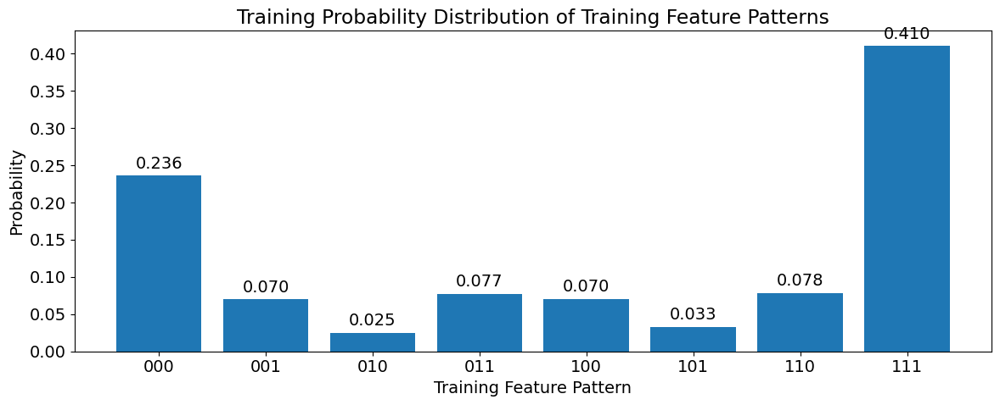

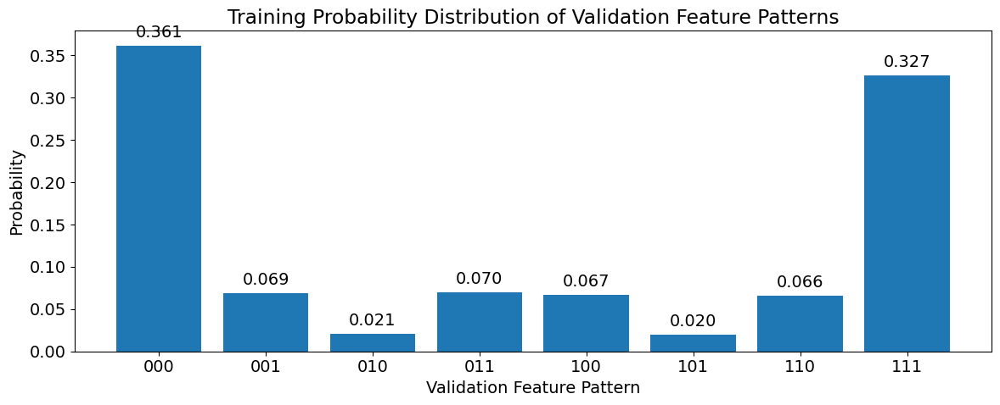

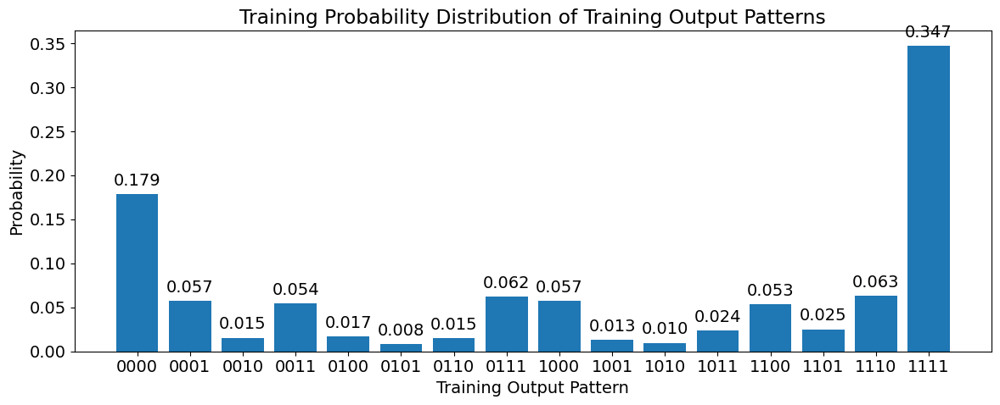

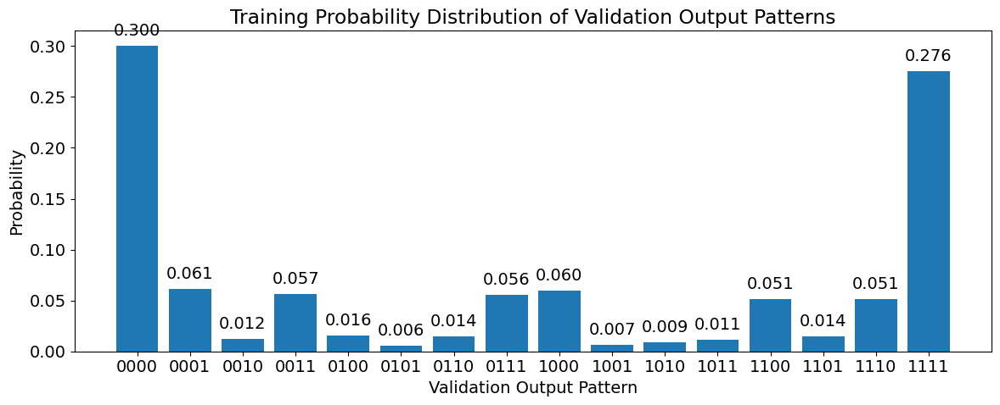

In [22]:
# Analyze global probability distributions (refactored with separate helpers)

probs_dict = {
    'train': {},
    'val': {}
}

def compute_distribution_vector(name, data_column, length):
    """Compute counts and probabilities for vector (window) data.

    - `data_column` is a Series/array of array-like windows.
    - `length` is the number of bits/features to consider from each window (truncate if longer).
    """
    patterns = np.array(list(product([0, 1], repeat=length)))
    pattern_strs = [''.join(map(str, p)) for p in patterns]

    # Stack windows into a 2D array and truncate to `length`
    data_arr = np.stack(pd.Series(data_column).apply(lambda x: np.asarray(x)[:length]))

    counts = np.array([np.sum(np.all(data_arr == p, axis=1)) for p in patterns])
    total = counts.sum()
    probs = counts / total if total > 0 else np.zeros_like(counts, dtype=float)

    # Plotting
    plt.figure(figsize=(12, 5))
    plt.bar(pattern_strs, probs)
    plt.ylabel('Probability')
    plt.xlabel(name + ' Pattern')
    plt.title('Training Probability Distribution of ' + name + ' Patterns')
    for i, v in enumerate(probs):
        plt.text(i, v + 0.01, f'{v:.3f}', ha='center')
    plt.tight_layout()
    plt.show()

    return {
        'patterns': patterns,
        'pattern_strs': pattern_strs,
        'counts': counts,
        'probs': torch.tensor(probs)
    }


def compute_distribution_scalar(name, data_column, n_classes, width=None):
    """Compute counts and probabilities for scalar (label) data.

    - `data_column` is a Series/array of integer labels (e.g., context indices).
    - `n_classes` is number of classes (e.g., 2**n_context).
    - `width` optionally controls the binary string width for pattern_strs.
    """
    if width is None:
        # infer minimal width to display binary strings
        width = int(np.ceil(np.log2(n_classes))) if n_classes > 1 else 1

    patterns = np.arange(n_classes)
    pattern_strs = [format(i, f'0{width}b') for i in patterns]

    data_arr = np.asarray(data_column).astype(int)
    counts = np.array([np.sum(data_arr == i) for i in patterns])
    total = counts.sum()
    probs = counts / total if total > 0 else np.zeros_like(counts, dtype=float)

    # Plotting
    plt.figure(figsize=(12, 5))
    plt.bar(pattern_strs, probs)
    plt.ylabel('Probability')
    plt.xlabel(name + ' Pattern')
    plt.title('Training Probability Distribution of ' + name + ' Patterns')
    for i, v in enumerate(probs):
        plt.text(i, v + 0.01, f'{v:.3f}', ha='center')
    plt.tight_layout()
    plt.show()

    return {
        'patterns': patterns,
        'pattern_strs': pattern_strs,
        'counts': counts,
        'probs': torch.tensor(probs)
    }

# 1) Feature patterns (first WINDOW_SIZE-1 entries)
n_features = WINDOW_SIZE - 1
probs_dict['train']['feature'] = compute_distribution_vector('Training Feature', df_train['window'], n_features)
probs_dict['val']['feature'] = compute_distribution_vector('Validation Feature', df_val['window'], n_features)

# 2) Output patterns (full WINDOW_SIZE entries)
n_window = WINDOW_SIZE
probs_dict['train']['output'] = compute_distribution_vector('Training Output', df_train['window'], n_window)
probs_dict['val']['output'] = compute_distribution_vector('Validation Output', df_val['window'], n_window)

---

## 6. Methods
Our methodology directly follows from [Mourya et al.](https://arxiv.org/abs/2503.01884). We employ Quantum Batch Gradient Update (QBGU), which takes advantage of the linearity of quantum mechanics to train all data simultaneously with a superposition of states. Another important feature of our model is Quantum Multi-Task Learning (QMTL), which allows the model to learn multiple assets at once using the "share and specify" architecture. The structure of our Contextual Quantum Neural Network consists of a hardware-efficient ansatz, "share and specify" predictive block, and a SWAP test to obtain fidelity loss. For parameter update, we use Simultaneous Perturbation Stochastic Approximation (SPSA), again facilitating the process by updating many parameters in backpropagation step.

### 6.1. Hardware Efficient Ansatz (State Preparation)

The data for our model is the smoothed finite difference of close prices for each of our stocks, binned into 1 or 0 for positive and negative differences, respectively. Our features are context windows of 3 days of binned data represented as a 3-qubit state (e.g. [0, 0, 1] would be $\ket{001}$), and the predicted probability of the stock price increasing or decreasing is represented by the respective coefficients in our output superposition state: $\ket{\psi_{out}} = \alpha \ket{0} + \beta \ket{1}$ implies that the probability of an increase or decrease are $\alpha^2$ and $\beta^2$, respectively.  
However, if we encode our input into a superposition of all features, we can effectively train on the entire dataset simeultaneously using QBGU. Our goal is to prepare our input data into the following quantum state, in which $c_{ijk}^2$ represents the proportion of [i, j, k] present in our input dataset:
$$\ket{\psi_{in}} = \sum_{i,j,k=0}^1 c_{ijk}\ket{ijk}$$
However, this presents a computational challenge. While any quantum state can theoretically be realized, the number of gate operations required can become intractable, making an extremely inefficient model, assuming you are running on actual quantum hardware rather than a simulator. The hardware-efficient ansatz aims to create an approximate state with a fixed number of gate operations. This ansatz consists of an initial layer of Hadamard gates, followed by L = 2 layers of a stack of RY, RZ gates and an entangling ring of CNOTs. The rotation parameters of these gates are trained independently of the prediction model using mean-squared error loss to obtain the desired input proportion quantum state.  
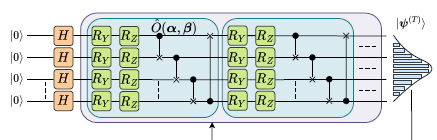Hardware-efficient Ansatz, Mourya et al.

In the cells below, we train the state preparation circuit for both our feature and target states using the hardware-efficient ansatz.

In [9]:
def hardware_efficient_ansatz(params, wires, L):
    #Hadamard layer
    for wire in wires:
        qml.Hadamard(wire)

    for l in range(L):
        for i in range(len(wires)):
            qml.RY(params[l][i][0], wires=wires[i])
            qml.RZ(params[l][i][1], wires=wires[i])

        for i in range(len(wires)):
            qml.CNOT(wires=[wires[i], wires[(i + 1) % len(wires)]])

In [10]:
# function to train hardware-efficient-ansatz to reach target probability distribution

L_SP = 2
N_EPOCHS_SP = 10000
LEARNING_RATE_SP = 0.1
INIT_PARAM_SCALE = 0.01
PATIENCE_SP = 200  # early-stopping patience (epochs)
MIN_DELTA_SP = 1e-8  # minimum improvement to reset patience
PRINT_INTERVAL = 50

def train_ansatz(target_probs, name, L=L_SP, lr=LEARNING_RATE_SP):

    num_wires = int(np.log2(len(target_probs)))

    dev_sp = qml.device("default.qubit", wires=num_wires)

    @qml.qnode(dev_sp, interface='torch', diff_method='spsa')
    def sp_circuit(params, num_wires):

        wires = range(num_wires)

        hardware_efficient_ansatz(params, wires, L)

        return qml.probs(wires=wires)

    # Initialize parameters as a NumPy array
    params_sp = nn.Parameter(torch.randn(L, num_wires, 2) * INIT_PARAM_SCALE)

    # Create SPSA optimizer
    opt_sp = torch.optim.Adam([params_sp], lr=lr)

    loss_fn_sp = nn.MSELoss()

    # Training loop using SPSA optimizer with early stopping
    losses_sp = []

    best_loss = float('inf')
    epochs_no_improve = 0
    # Keep a copy of best parameters (detached tensor)
    best_params_sp = params_sp.detach().clone()

    print("Beginning Ansatz Training for", name)

    for epoch in range(N_EPOCHS_SP):
        # Single SPSA update step

        y_pred = sp_circuit(params_sp, num_wires)

        loss = loss_fn_sp(y_pred, target_probs)

        loss.backward()

        opt_sp.step()

        opt_sp.zero_grad()

        loss_value = loss.item()
        losses_sp.append(loss_value)

        # Check improvement for early stopping
        if loss_value < best_loss - MIN_DELTA_SP:
            best_loss = loss_value
            epochs_no_improve = 0
            best_params_sp = params_sp.detach().clone()
        else:
            epochs_no_improve += 1

        # Print progress
        if (epoch + 1) % PRINT_INTERVAL == 0 or epoch == N_EPOCHS_SP - 1:
            print(f"Epoch {epoch+1} - MSE Loss: {loss_value:.9f} - Best: {best_loss:.9f} - Stalled: {epochs_no_improve}/{PATIENCE_SP}")

        # Early stopping check
        if epochs_no_improve >= PATIENCE_SP:
            print(f"Early stopping at epoch {epoch+1} (no improvement for {PATIENCE_SP} epochs).")
            break

    target_out_np = target_probs.detach().numpy()
    final_out_np = sp_circuit(best_params_sp, num_wires).detach().numpy()

    # Plot training loss
    plt.figure(figsize=(8, 4))
    plt.plot(range(1, len(losses_sp) + 1), losses_sp)
    plt.xlabel('Epoch')
    plt.ylabel('MSE Loss')
    plt.title('State Preparation for ' + name)
    plt.grid(True)
    plt.show()

    patterns = np.array(list(product([0, 1], repeat=num_wires)))
    pattern_strs = [''.join(map(str, p)) for p in patterns]

    #Plot target probabilities and predicted probabilites
    x = np.arange(len(pattern_strs))
    width = 0.35  # Width of the bars

    plt.figure(figsize=(12, 6))
    plt.bar(x - width/2, target_out_np, width, label='Target')
    plt.bar(x + width/2, final_out_np, width, label='Predicted')

    plt.ylabel('Probability (sqrt)')
    plt.xlabel('Feature Pattern')
    plt.title('Predicted vs. Target Probability Distribution of ' + name + ' Patterns')
    plt.xticks(x, pattern_strs)
    plt.legend()

    # Add probability values on top of bars
    for i, (v1, v2) in enumerate(zip(target_out_np, final_out_np)):
        plt.text(i - width/2, v1 + 0.01, f'{v1:.3f}', ha='center')
        plt.text(i + width/2, v2 + 0.01, f'{v2:.3f}', ha='center')

    plt.tight_layout()
    plt.show()

    print(qml.draw(sp_circuit)(best_params_sp, num_wires))    

    return best_params_sp


In [10]:
# train ansatz for all elements of probs_dict

sp_params = {
    'train': nn.ParameterDict(),
    'val': nn.ParameterDict()
}

L_list = {
    'feature': 3,
    'output': 4}
lr_list = {
    'feature': 0.05,
    'output': 0.01
}

Beginning Ansatz Training for Training feature
Epoch 50 - MSE Loss: 0.000230217 - Best: 0.000230217 - Stalled: 0/200
Epoch 100 - MSE Loss: 0.000056646 - Best: 0.000056273 - Stalled: 2/200
Epoch 150 - MSE Loss: 0.000018559 - Best: 0.000018559 - Stalled: 0/200
Epoch 200 - MSE Loss: 0.000000425 - Best: 0.000000425 - Stalled: 0/200
Epoch 250 - MSE Loss: 0.000000017 - Best: 0.000000019 - Stalled: 3/200
Epoch 300 - MSE Loss: 0.000000001 - Best: 0.000000008 - Stalled: 25/200
Epoch 350 - MSE Loss: 0.000000000 - Best: 0.000000008 - Stalled: 75/200
Epoch 400 - MSE Loss: 0.000000000 - Best: 0.000000008 - Stalled: 125/200
Epoch 450 - MSE Loss: 0.000000000 - Best: 0.000000008 - Stalled: 175/200
Early stopping at epoch 475 (no improvement for 200 epochs).


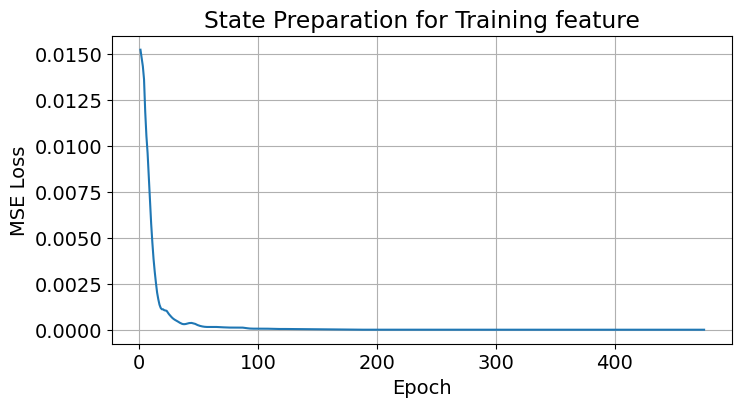

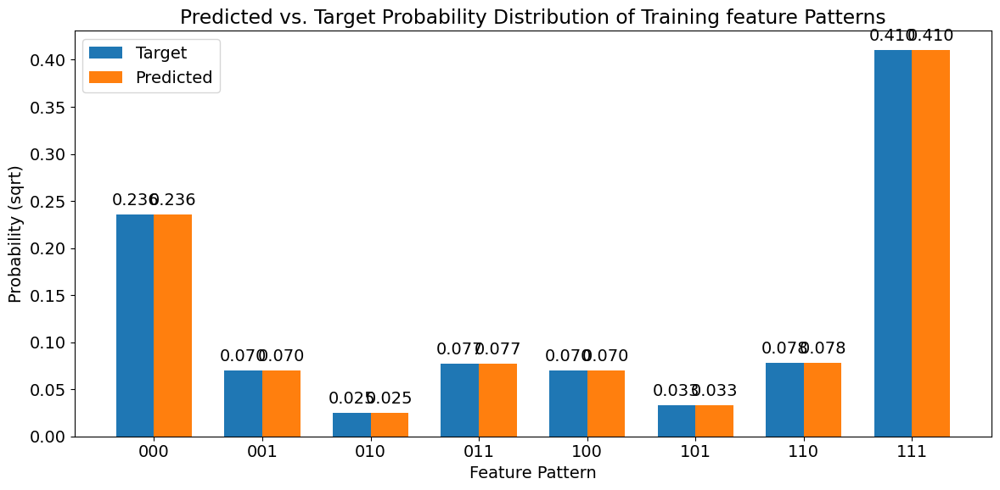

0: ──H──RY(0.09)───RZ(0.66)──╭●────╭X──RY(-0.66)──RZ(-0.33)─╭●────╭X──RY(-0.41)──RZ(-0.18)─╭●────╭X─┤
1: ──H──RY(-0.00)──RZ(-0.27)─╰X─╭●─│───RY(0.08)───RZ(-0.40)─╰X─╭●─│───RY(0.29)───RZ(-0.32)─╰X─╭●─│──┤
2: ──H──RY(-0.20)──RZ(-0.01)────╰X─╰●──RY(-0.09)──RZ(0.47)─────╰X─╰●──RY(-0.90)──RZ(-0.25)────╰X─╰●─┤

  ╭Probs
  ├Probs
  ╰Probs
Beginning Ansatz Training for Training output
Epoch 50 - MSE Loss: 0.002737677 - Best: 0.002737677 - Stalled: 0/200
Epoch 100 - MSE Loss: 0.000609954 - Best: 0.000609954 - Stalled: 0/200
Epoch 150 - MSE Loss: 0.000173180 - Best: 0.000173180 - Stalled: 0/200
Epoch 200 - MSE Loss: 0.000072848 - Best: 0.000072848 - Stalled: 0/200
Epoch 250 - MSE Loss: 0.000032446 - Best: 0.000032446 - Stalled: 0/200
Epoch 300 - MSE Loss: 0.000017320 - Best: 0.000017320 - Stalled: 0/200
Epoch 350 - MSE Loss: 0.000009976 - Best: 0.000009976 - Stalled: 0/200
Epoch 400 - MSE Loss: 0.000007587 - Best: 0.000007587 - Stalled: 0/200
Epoch 450 - MSE Loss: 0.000005532 - Best: 0.000005532

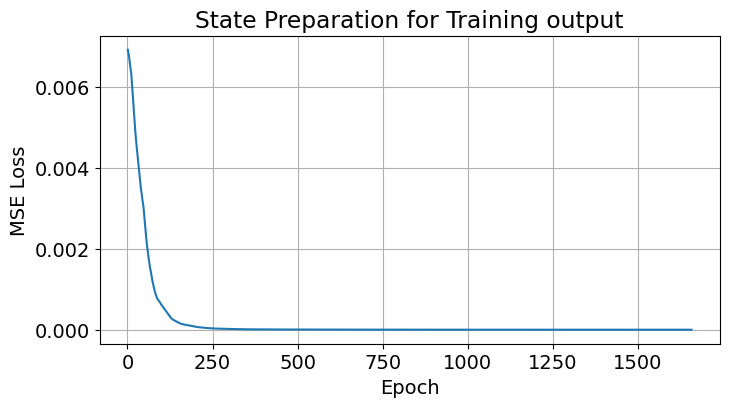

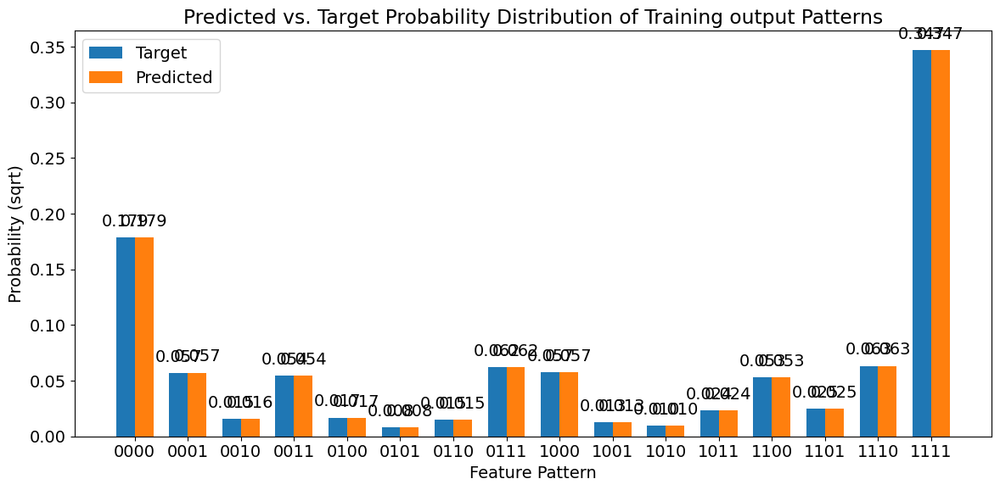

0: ──H──RY(0.04)───RZ(-0.03)─╭●───────╭X──RY(-0.26)──RZ(0.04)──╭●───────╭X──RY(-0.36)──RZ(0.04)──╭●
1: ──H──RY(-0.08)──RZ(0.09)──╰X─╭●────│───RY(0.07)───RZ(0.02)──╰X─╭●────│───RY(0.05)───RZ(-0.20)─╰X
2: ──H──RY(0.08)───RZ(0.24)─────╰X─╭●─│───RY(-0.43)──RZ(-0.03)────╰X─╭●─│───RY(0.08)───RZ(-0.10)───
3: ──H──RY(0.07)───RZ(-0.06)───────╰X─╰●──RY(0.08)───RZ(0.12)────────╰X─╰●──RY(-0.17)──RZ(0.03)────

────────╭X──RY(-0.15)──RZ(-0.11)─╭●───────╭X─┤ ╭Probs
──╭●────│───RY(0.12)───RZ(0.07)──╰X─╭●────│──┤ ├Probs
──╰X─╭●─│───RY(-0.57)──RZ(-0.08)────╰X─╭●─│──┤ ├Probs
─────╰X─╰●──RY(-0.58)──RZ(-0.16)───────╰X─╰●─┤ ╰Probs
Beginning Ansatz Training for Validation feature
Epoch 50 - MSE Loss: 0.000232253 - Best: 0.000218518 - Stalled: 3/200
Epoch 100 - MSE Loss: 0.000041819 - Best: 0.000041819 - Stalled: 0/200
Epoch 150 - MSE Loss: 0.000005220 - Best: 0.000005220 - Stalled: 0/200
Epoch 200 - MSE Loss: 0.000001032 - Best: 0.000001032 - Stalled: 0/200
Epoch 250 - MSE Loss: 0.000000182 - Best: 0.0000001

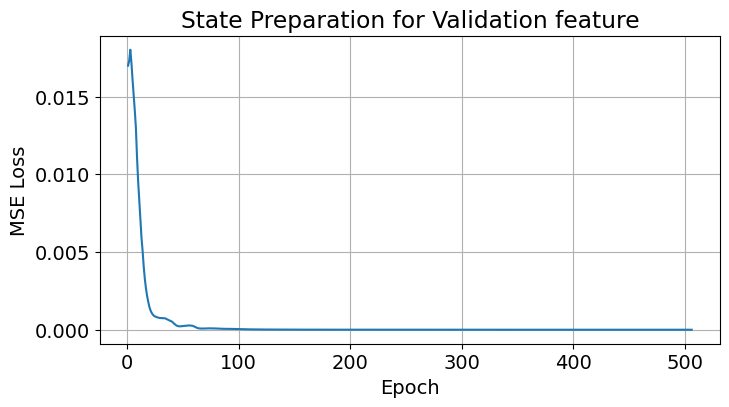

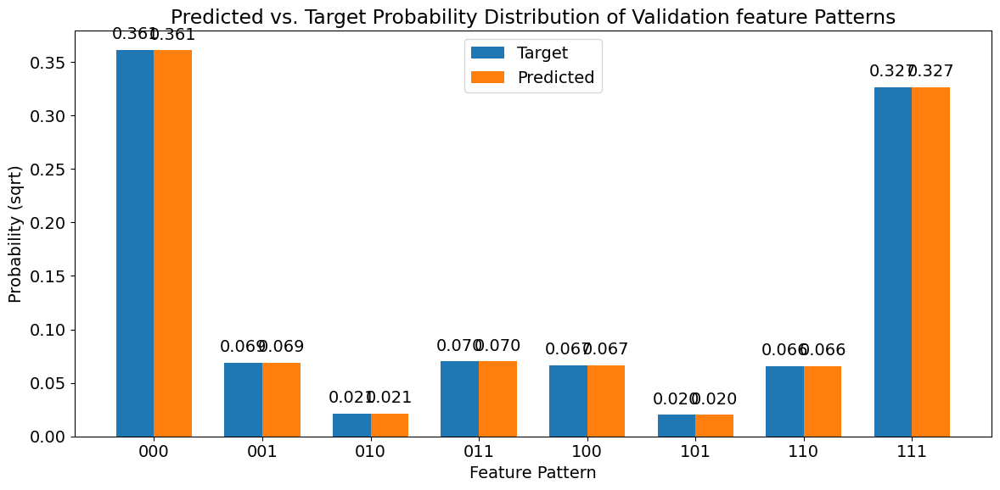

0: ──H──RY(0.12)───RZ(0.14)──╭●────╭X──RY(-0.47)──RZ(-0.12)─╭●────╭X──RY(-0.64)──RZ(-0.14)─╭●────╭X─┤
1: ──H──RY(-0.48)──RZ(-0.21)─╰X─╭●─│───RY(-0.01)──RZ(0.41)──╰X─╭●─│───RY(-0.02)──RZ(0.07)──╰X─╭●─│──┤
2: ──H──RY(-0.01)──RZ(-0.32)────╰X─╰●──RY(-0.08)──RZ(-0.37)────╰X─╰●──RY(-0.52)──RZ(0.01)─────╰X─╰●─┤

  ╭Probs
  ├Probs
  ╰Probs
Beginning Ansatz Training for Validation output
Epoch 50 - MSE Loss: 0.002283053 - Best: 0.002283053 - Stalled: 0/200
Epoch 100 - MSE Loss: 0.000632498 - Best: 0.000632498 - Stalled: 0/200
Epoch 150 - MSE Loss: 0.000264357 - Best: 0.000264357 - Stalled: 0/200
Epoch 200 - MSE Loss: 0.000134851 - Best: 0.000134851 - Stalled: 0/200
Epoch 250 - MSE Loss: 0.000059726 - Best: 0.000059726 - Stalled: 0/200
Epoch 300 - MSE Loss: 0.000030619 - Best: 0.000030619 - Stalled: 0/200
Epoch 350 - MSE Loss: 0.000018185 - Best: 0.000018185 - Stalled: 0/200
Epoch 400 - MSE Loss: 0.000010588 - Best: 0.000010588 - Stalled: 0/200
Epoch 450 - MSE Loss: 0.000007375 - Best: 0.0000073

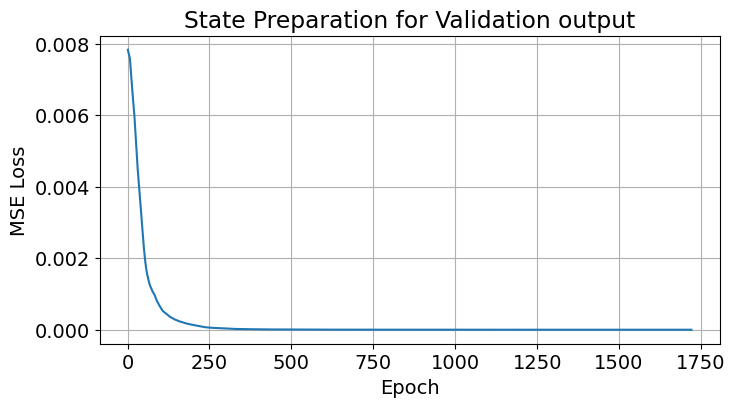

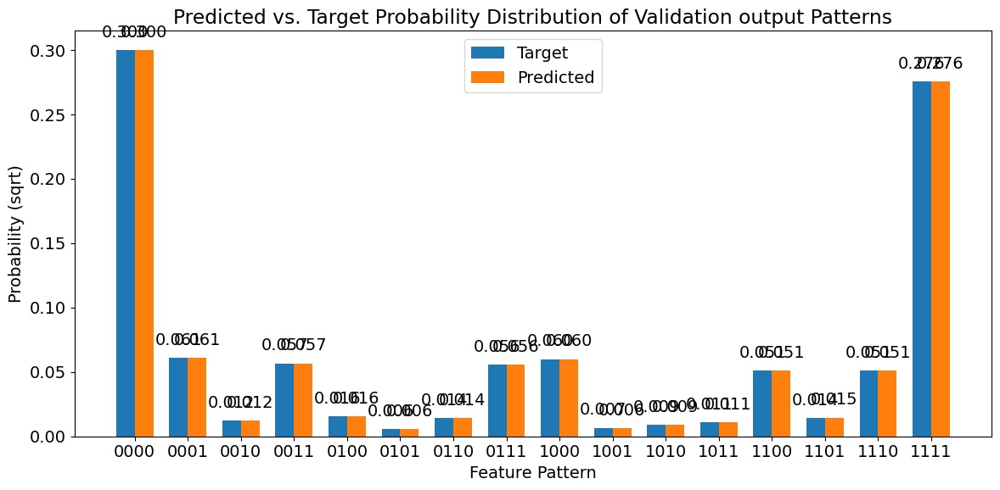

0: ──H──RY(-0.01)──RZ(-0.03)─╭●───────╭X──RY(-0.32)──RZ(0.05)──╭●───────╭X──RY(-0.43)──RZ(-0.05)─╭●
1: ──H──RY(-0.07)──RZ(-0.00)─╰X─╭●────│───RY(-0.01)──RZ(0.15)──╰X─╭●────│───RY(-0.04)──RZ(-0.03)─╰X
2: ──H──RY(0.00)───RZ(0.07)─────╰X─╭●─│───RY(-0.37)──RZ(-0.01)────╰X─╭●─│───RY(-0.05)──RZ(0.06)────
3: ──H──RY(-0.01)──RZ(0.02)────────╰X─╰●──RY(-0.07)──RZ(-0.00)───────╰X─╰●──RY(-0.18)──RZ(-0.01)───

────────╭X──RY(-0.22)──RZ(0.01)──╭●───────╭X─┤ ╭Probs
──╭●────│───RY(0.04)───RZ(-0.03)─╰X─╭●────│──┤ ├Probs
──╰X─╭●─│───RY(-0.68)──RZ(-0.11)────╰X─╭●─│──┤ ├Probs
─────╰X─╰●──RY(-0.67)──RZ(0.18)────────╰X─╰●─┤ ╰Probs


In [26]:
# Train ansatz for each probability distribution in probs_dict
for key, target_probs in probs_dict['train'].items():
    sp_params['train'][key] = train_ansatz(target_probs['probs'], 'Training ' + key, L=L_list[key], lr=lr_list[key])
for key, target_probs in probs_dict['val'].items():
    sp_params['val'][key] = train_ansatz(target_probs['probs'], 'Validation ' + key, L=L_list[key], lr=lr_list[key])

In [27]:
#Save state-preparation parameters
torch.save(sp_params, 'sp_params.pth')

### 6.2. Share-and-Specify Architecture & SWAP Test

**Context Qubits**
Our QMTL architecture allows us to train all stock data at once (rather than splitting it up by ticker) by utilizing a quantum superposition of the 'context qubits,' which indicate which stock the data is from (e.g. 'AAPL' = $\ket{00}$, 'AMZN' = $\ket{01}$). This enables us to use the 'specify' blocks of our training architecture, which are controlled blocks that only operate if our context qubits are in a certain state. We determine the proportion of each stock in our training dataset, then encode this into a quantum state which our context qubits will take on during training. This procedure is the same as we used above for our input and target qubits.  

**Share-and-Specify**  
This component is the actual predictive element of our circuit. The 'shared' blocks are applied to all features regardless of their corresponding stock, indicated by the context qubits. However, the 'specify' blocks are only applied to states that correspond to the designated stock. The shared & specify blocks share the same structure: RY and RX gates applied to each qubit followed by an entangling ring. The trainable parameters are the rotation angle of the RY and RX gates. Each layer consists of one shared block, and one specify block for each ticker we are using. We are using L = 2 layers.  
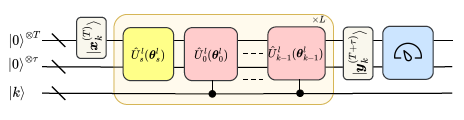 Share-and-Specify Architecture, Mourya et al.

**SWAP TEST**  
When measuring a qubit, it collapses to just one state, destroying all information about its probabilities for each state. Thus to compare our predicted state to the target state, we would need to measure each of these qubits many times to determine if their states match. And the number of possible states, and hence measurements required, grows exponentially with our number of qubits. This can be circumvented with the SWAP Test, which places the total difference between these two states into a single ancillary qubit. If the qubit measures 0 every time, the states are perfectly identical.  We use fidelity loss, 1 - P(0), where P(0) is the probability of the ancillary qubit measuring 0. Thus the number of times we need to run the circuit to obtain fidelity is only linear. However, since we are working on a simulator (not actual hardware), we are able to simply calculate the probabilities in one go, bypassing the need to run each parameter state multiple times.  
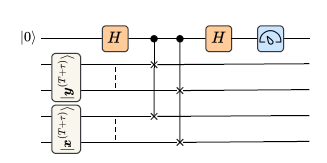SWAP Test, Mourtya et al.  
To implement the SWAP test, we apply a Hadamard to the ancillary qubit, then CSWAPs between each predicted-target qubit pair. We then apply another Hadamard on the ancillary qubit prior to measurement.  

We implement this architecture in the following cells:


In [12]:
#load params
sp_params = torch.load('final_sp_params.pth', weights_only=False) # change to sp_params if you run again

In [13]:
#Build the circuit
N_BINS = 2

# 0-1: context qubits
# 2-4: input qubits
# 5: output qubit
N_CONTEXT_WIRES = int(np.log2(df_diff_binary.shape[1]))  # Number of qubits needed to represent stocks
N_OUTPUT_WIRES = int(np.log2(N_BINS))
N_INPUT_WIRES = WINDOW_SIZE - N_OUTPUT_WIRES
N_TARGET_WIRES = N_INPUT_WIRES + N_OUTPUT_WIRES
N_TOTAL_WIRES = N_CONTEXT_WIRES + N_INPUT_WIRES + N_OUTPUT_WIRES + N_TARGET_WIRES + 1 #ancillary qubit

N_LAYERS = 2

input_wires = list(range(N_INPUT_WIRES))
output_wires = list(range(N_INPUT_WIRES, N_INPUT_WIRES + N_OUTPUT_WIRES))
context_wires = list(range(N_INPUT_WIRES + N_OUTPUT_WIRES, N_INPUT_WIRES + N_OUTPUT_WIRES + N_CONTEXT_WIRES))
target_wires = list(range(N_INPUT_WIRES + N_OUTPUT_WIRES + N_CONTEXT_WIRES, N_TOTAL_WIRES - 1))
ancillary_wire = N_TOTAL_WIRES - 1
comp_wires = list(range(N_INPUT_WIRES + N_OUTPUT_WIRES))

# Define device using simulator for training
dev = qml.device("default.qubit", wires=N_TOTAL_WIRES)

# layer for both either the shared or specify ansatz (input is just trainable parameters)
def U_ss(params):
    """A single (L=1) ansatz layer (Rotations + CNOTs)."""
    # 1. Trainable Rotations
    for i, wire in enumerate(comp_wires):
        qml.RY(params[i][0], wires=wire)
        qml.RZ(params[i][1], wires=wire)
    
    # 2. Entangling "Ring"
    for i in range(len(comp_wires)):
        qml.CNOT(wires=[comp_wires[i], comp_wires[(i + 1) % len(comp_wires)]])

# "Share & Specify" ansatz for training
def ss_ansatz(params, n_layers):
#Implement shared variational layers
    for l in range(n_layers):
        U_ss(params['shared'][l])

    # Implement control gates for specify layers
        for context_state in [0, 1, 2, 3]:
            # Convert integer context_state to binary sequence
            context_binary = tuple(int(x) for x in format(context_state, f'0{N_CONTEXT_WIRES}b'))
            # Apply controlled U_ss using the control bitstring and index into the spec params
            qml.ctrl(U_ss, control=context_wires, control_values=context_binary)(params['spec'][context_state][l])

# SWAP test implementation
def SWAP_test():
    qml.Hadamard(wires=ancillary_wire)

    for i in range(N_TARGET_WIRES):
        # CSWAP gate
        qml.CSWAP(wires=[ancillary_wire, comp_wires[i], target_wires[i]])
    
    qml.Hadamard(wires=ancillary_wire)

@qml.qnode(dev, interface='torch', diff_method='spsa')
def qmtl_circuit(ss_params, key='train'): # context is a classical input for now
    
    # State preparation for features, targets, & contexts
    hardware_efficient_ansatz(sp_params[key]['feature'], input_wires, L_list['feature'])
    hardware_efficient_ansatz(sp_params[key]['output'], target_wires, L_list['output'])
    for wire in context_wires:
        qml.Hadamard(wires=wire) #equal probability of each; hardware-efficient ansatz not necessary
    
    qml.Barrier(range(N_TOTAL_WIRES))
    # Share & Specify ansatz
    ss_ansatz(ss_params, N_LAYERS)

    qml.Barrier(range(N_TOTAL_WIRES))
    
    # perform SWAP test
    SWAP_test()

    # Measure fidelity (1 - P(0) in ancillary qubit)
    return qml.probs(ancillary_wire)


---

## 7. Results
### 7.1 Model Training (SPSA)
The trainable parameters in our model are the rotation parameters for the RX and RY gates in our share-and-specify ansatz. These are updated using Simultaneous Perturbation Stochastic Approximation, which perturbs all parameters at once and updates them all according to the learning rate. This significantly reduces computation required for training compared to parameter-shift, reducing an entire epoch to one update step. After many update steps each parameter eventually falls into its rightful place, analogous to a game of Plinko, where the landing place of many balls forms a Gaussian.

Learning rate and patience were chosen arbitrarily at 0.01 and 50 to give ample time and space for parameters to vary. The number of epochs which minimizes fidelity loss of the validation set will be kept to prevent overfitting to the training set. This also provides a healthy amount of cross-validation to ensure our model isn't simply memorizing the training or testing data. 

In [ ]:
#Train prediction circuit

LEARNING_RATE = 0.01
# We use a large max epoch but rely on early stopping
N_EPOCHS = 100000
PATIENCE = 50  # early-stopping patience (epochs)
MIN_DELTA = 1e-9  # minimum improvement required to reset patience

# How often to evaluate validation loss (in epochs)
VAL_EVAL_EVERY = 50

def init_params():
    """
    Initialize the trainable parameters using torch.nn.Parameter
    """
    n_params_per_layer = len(comp_wires) # 3 input + 1 output = 4
    
    # --- Shared Parameters ---
    # We need L=2 layers of 4 params each
    shared_params = torch.randn(N_LAYERS, n_params_per_layer, 2, requires_grad=True)
    
    # --- Specify Parameters ---
    # We need K=4 sets of (L=2 layers * 4 params each)
    n_stocks = 2**N_CONTEXT_WIRES
    spec_params = torch.randn(n_stocks, N_LAYERS, n_params_per_layer, 2, requires_grad=True)
    
    # We use torch.nn.ParameterDict to keep them organized
    return nn.ParameterDict({
        "shared": nn.Parameter(shared_params),
        "spec": nn.Parameter(spec_params)
    })

#Train the circuit
ss_params = init_params()
ss_optimizer = torch.optim.Adam(ss_params.values(), lr=LEARNING_RATE)

def fidelity_loss(params, key='train'):
    # Run circuit
    y_pred = qmtl_circuit(params, key)

    return 1 - y_pred[0]  # Fidelity loss: 1 - P(0)

print("\n--- Starting Training (with validation monitoring) ---")

# --- Run Epochs (monitor training + validation) ---
train_loss_hist = []
val_loss_hist = []
best_val_loss = float('inf')
epochs_no_improve = 0
# Keep a copy of best params (as detached clones)
best_ss_params = {k: v.detach().clone() for k, v in ss_params.items()}

for epoch in range(N_EPOCHS):
    # Do Quantum Batch Gradient Update (QBGU)
    train_loss = fidelity_loss(ss_params, 'train')

    # Calculate Gradients
    train_loss.backward()

    # Update parameters
    ss_optimizer.step()

    # Clear gradients
    ss_optimizer.zero_grad()

    train_loss_value = train_loss.item()
    train_loss_hist.append(train_loss_value)

    # Periodically evaluate validation loss
    if (epoch + 1) % VAL_EVAL_EVERY == 0 or epoch == N_EPOCHS - 1:
        val_loss = fidelity_loss(ss_params, 'val')

        val_loss_value = val_loss.item()
        val_loss_hist.append(val_loss_value)

        # Use validation loss for early stopping
        if val_loss < best_val_loss - MIN_DELTA:
            best_val_loss = val_loss
            epochs_no_improve = 0
            best_params = {k: v.detach().clone() for k, v in ss_params.items()}
        else:
            epochs_no_improve += 1

    # Print progress at reasonable intervals
    if (epoch + 1) % VAL_EVAL_EVERY == 0 or epoch == N_EPOCHS - 1:
        val_str = f" - Val: {val_loss:.6f}" if len(val_loss_hist) > 0 else ""
        print(f"Epoch {epoch+1} - Fidelity Loss: {train_loss_value:.6f} - Best Val: {best_val_loss:.6f} - Stalled: {epochs_no_improve}/{PATIENCE}" + val_str)

    # Early stopping based on validation
    if epochs_no_improve >= PATIENCE:
        print(f"Early stopping at epoch {epoch+1} (no improvement for {PATIENCE} epochs).")
        break

#save params
torch.save(best_params, 'ss_params.pth')

print("--- Training Complete ---")

# Plot training and validation loss on same figure
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_loss_hist) + 1), train_loss_hist, label='Train Loss')
if len(val_loss_hist) > 0:
    # map val_loss_hist x-axis to the epoch numbers where we evaluated
    val_x = list(range(VAL_EVAL_EVERY, VAL_EVAL_EVERY * len(val_loss_hist) + 1, VAL_EVAL_EVERY))
    # ensure same length
    val_x = val_x[:len(val_loss_hist)]
    plt.plot(val_x, val_loss_hist, label='Validation Loss')

plt.xlabel('Epoch')
plt.ylabel('Fidelity Loss')
plt.title('Prediction Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()


--- Starting Training (with validation monitoring) ---
Epoch 50 - Fidelity Loss: 0.422671 - Best Val: 0.447736 - Stalled: 0/50 - Val: 0.447736
Epoch 100 - Fidelity Loss: 0.409368 - Best Val: 0.442366 - Stalled: 0/50 - Val: 0.442366
Epoch 150 - Fidelity Loss: 0.381558 - Best Val: 0.430250 - Stalled: 0/50 - Val: 0.430250
Epoch 200 - Fidelity Loss: 0.347066 - Best Val: 0.409885 - Stalled: 0/50 - Val: 0.409885
Epoch 250 - Fidelity Loss: 0.327704 - Best Val: 0.395808 - Stalled: 0/50 - Val: 0.395808
Epoch 300 - Fidelity Loss: 0.310064 - Best Val: 0.391354 - Stalled: 0/50 - Val: 0.391354
Epoch 350 - Fidelity Loss: 0.302374 - Best Val: 0.383101 - Stalled: 0/50 - Val: 0.383101
Epoch 400 - Fidelity Loss: 0.294504 - Best Val: 0.382838 - Stalled: 0/50 - Val: 0.382838
Epoch 450 - Fidelity Loss: 0.270980 - Best Val: 0.376011 - Stalled: 0/50 - Val: 0.376011
Epoch 500 - Fidelity Loss: 0.261162 - Best Val: 0.364891 - Stalled: 0/50 - Val: 0.364891
Epoch 550 - Fidelity Loss: 0.255977 - Best Val: 0.35052

We visualize the resultant circuit below

In [14]:
#load params
ss_params = torch.load('final_ss_params.pth', weights_only=False) # change to ss_params if you run again

#Plot the final circuit

# 0: Input 1
# 1: Input 2
# 2: Input 3
# 3: Output
# 4: Context 1
# 5: Context 2
# 6: Target 1
# 7: Target 2
# 8: Target 3
# 9: Target 4 (output)
# 10: Ancillary

print(qml.draw(qmtl_circuit)(ss_params))
#print(qml.draw_mpl(qmtl_circuit)(params))

 0: ──H──RY(0.09)───RZ(0.66)──╭●────╭X──RY(-0.66)──RZ(-0.33)─╭●────────────╭X──RY(-0.41)──RZ(-0.18)
 1: ──H──RY(-0.00)──RZ(-0.27)─╰X─╭●─│───RY(0.08)───RZ(-0.40)─╰X─────────╭●─│───RY(0.29)───RZ(-0.32)
 2: ──H──RY(-0.20)──RZ(-0.01)────╰X─╰●──RY(-0.09)──RZ(0.47)─────────────╰X─╰●──RY(-0.90)──RZ(-0.25)
 3: ───────────────────────────────────────────────────────────────────────────────────────────────
 4: ──H────────────────────────────────────────────────────────────────────────────────────────────
 5: ──H────────────────────────────────────────────────────────────────────────────────────────────
 6: ──H──RY(0.04)───RZ(-0.03)─╭●───────╭X──────────RY(-0.26)──RZ(0.04)──╭●───────────────╭X────────
 7: ──H──RY(-0.08)──RZ(0.09)──╰X─╭●────│───────────RY(0.07)───RZ(0.02)──╰X─╭●────────────│─────────
 8: ──H──RY(0.08)───RZ(0.24)─────╰X─╭●─│───────────RY(-0.43)──RZ(-0.03)────╰X─╭●─────────│─────────
 9: ──H──RY(0.07)───RZ(-0.06)───────╰X─╰●──────────RY(0.08)───RZ(0.12)────────╰X─────────╰●────────


### 7.2 Testing
To evaluate our model, we calculate accuracy, precision, and f1-score on the test set for each of our prediction classes (stock up or down) and the corresponding confusion matrix. Since our dataset is disproportionate, as in general the stock market will increase more than it will decrease, we utilize Matthew's Correlation Coefficient to evaluate performance as well.

Quantum mechanics is probabilistic. If we were to run on hardware, we would have to determine the correctly predicted class by running the circuit many times on the same input, similar to a Bayesian neural network. Since we are running on a simulator, we have the advantage of determining the probability theoretically and picking the class with the max probability to only run once per test sample. We take this approach to save time.

We determine our performance metrics on the entire test set, as well as each individual stock to more closely examine how the model performs.

In [15]:
# Split test windows and prepare quantum states

# Create columns for input and target from each window
df_test['input'] = df_test['window'].apply(lambda x: x[:WINDOW_SIZE-1])  # First 3 entries
df_test['target'] = df_test['window'].apply(lambda x: x[-1])  # Last entry

N_TEST_WIRES = N_CONTEXT_WIRES + N_INPUT_WIRES + N_OUTPUT_WIRES

# Prepare quantum device for input states
dev_test = qml.device("default.qubit", wires=N_TEST_WIRES)

# circuit for testing
@qml.qnode(dev_test, interface='torch')
def test_circuit(features, context):
    #Prepare context state
    context_state = [context // 2, context % 2]
    qml.BasisState(context_state, wires=context_wires)
    
    # Prepare input state (should be just X gates)
    qml.BasisState(features, wires=input_wires)

    qml.Barrier(range(N_TEST_WIRES))
    # Prediction circuit (share & specify ansatz)
    ss_ansatz(ss_params, N_LAYERS)

    return qml.probs(output_wires)


In [16]:
#Evaluate on test set
test_results = []

for idx, row in df_test.iterrows():
    # Get input features as a list of integers (0/1)
    input_features = row['input'].tolist()
    input_context = row['context']
    
    # Run test circuit
    probs = test_circuit(input_features, input_context)
    
    # Predicted class is the one with highest probability
    predicted_class = torch.argmax(probs).item()
    
    test_results.append({
        'context': row['context'],
        'input': input_features,
        'target': row['target'],
        'predicted': predicted_class,
        'probs': probs.detach().numpy()
    })

    if idx % 50 == 0:
        print(f"Processed {idx+1}/{len(df_test)} test samples.")



Processed 1/904 test samples.
Processed 51/904 test samples.
Processed 101/904 test samples.
Processed 151/904 test samples.
Processed 201/904 test samples.
Processed 251/904 test samples.
Processed 301/904 test samples.
Processed 351/904 test samples.
Processed 401/904 test samples.
Processed 451/904 test samples.
Processed 501/904 test samples.
Processed 551/904 test samples.
Processed 601/904 test samples.
Processed 651/904 test samples.
Processed 701/904 test samples.
Processed 751/904 test samples.
Processed 801/904 test samples.
Processed 851/904 test samples.
Processed 901/904 test samples.


Accuracy: 0.5686
Recall (weighted): 0.5686

Classification Report:
              precision    recall  f1-score   support

           0       0.45      0.56      0.50       350
           1       0.67      0.57      0.62       554

    accuracy                           0.57       904
   macro avg       0.56      0.57      0.56       904
weighted avg       0.59      0.57      0.57       904



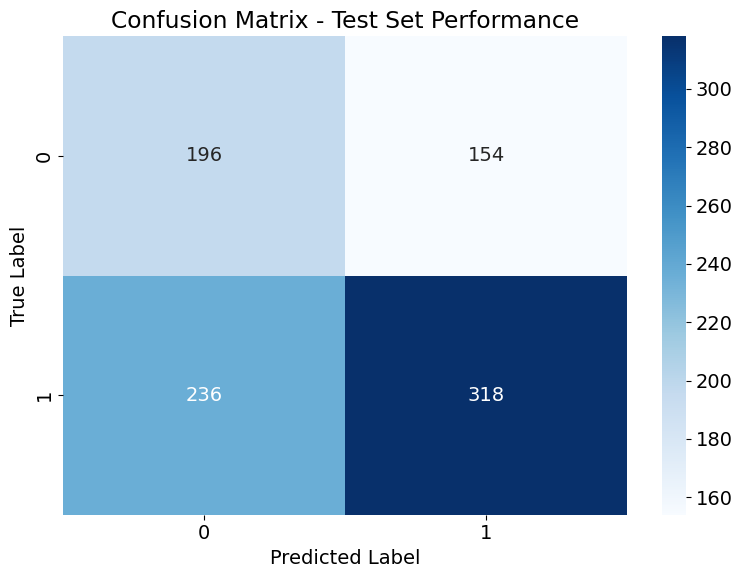


Confusion Matrix:
[[196 154]
 [236 318]]


In [17]:
# Extract predictions and targets
y_true = [r['target'] for r in test_results]
y_pred = [r['predicted'] for r in test_results]

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)

print(f"Accuracy: {accuracy:.4f}")
print(f"Recall (weighted): {recall:.4f}")
print("\nClassification Report:")
print(classification_report(y_true, y_pred))

# Create confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Test Set Performance')
plt.tight_layout()
plt.show()

# Print confusion matrix details
print("\nConfusion Matrix:")
print(cm)

PER-STOCK PERFORMANCE ANALYSIS

Context AAPL
Samples: 226
Accuracy: 0.6327
Recall (weighted): 0.6327

Confusion Matrix:
[[44 43]
 [40 99]]

Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.51      0.51        87
           1       0.70      0.71      0.70       139

    accuracy                           0.63       226
   macro avg       0.61      0.61      0.61       226
weighted avg       0.63      0.63      0.63       226


Context AMZN
Samples: 226
Accuracy: 0.6549
Recall (weighted): 0.6549

Confusion Matrix:
[[ 44  40]
 [ 38 104]]

Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.52      0.53        84
           1       0.72      0.73      0.73       142

    accuracy                           0.65       226
   macro avg       0.63      0.63      0.63       226
weighted avg       0.65      0.65      0.65       226


Context GOOG
Samples: 226
Accuracy: 0.5796
Rec

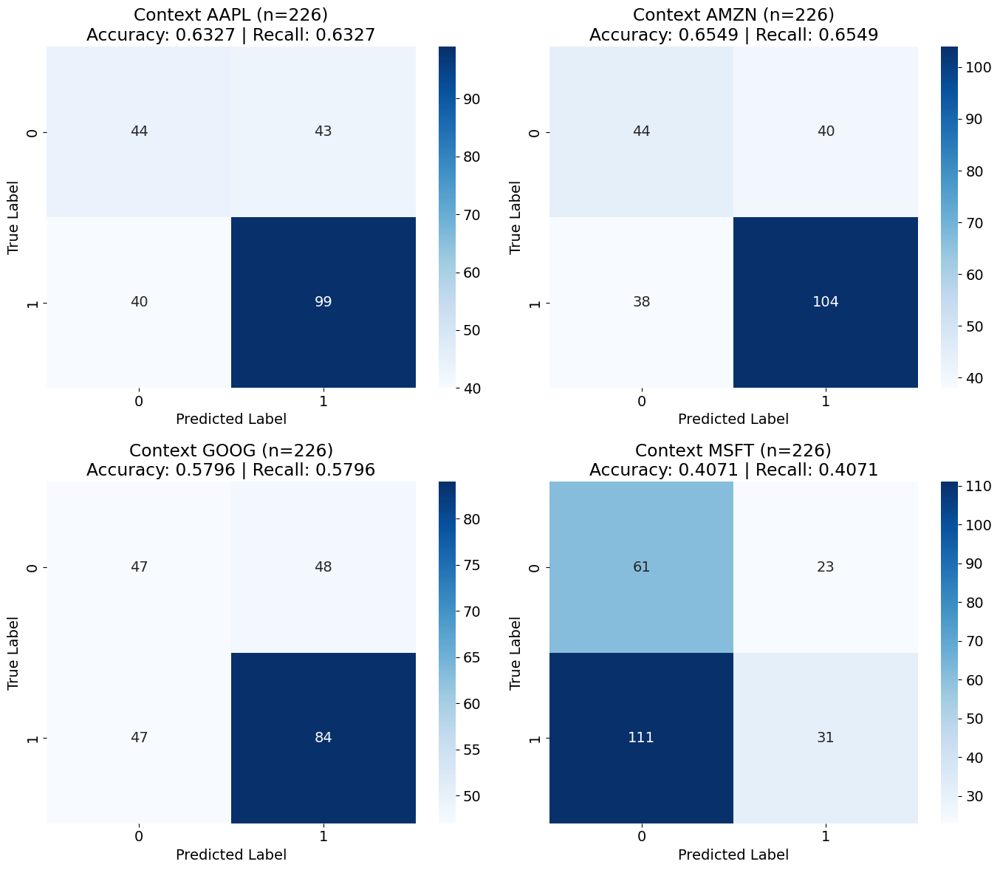


SUMMARY TABLE
  n_samples  accuracy    recall
0       226  0.632743  0.632743
1       226  0.654867  0.654867
2       226  0.579646  0.579646
3       226   0.40708   0.40708


In [18]:
# Compute confusion matrices and metrics for each context
stock_names = ['AAPL', 'AMZN', 'GOOG', 'MSFT']

print("=" * 60)
print("PER-STOCK PERFORMANCE ANALYSIS")
print("=" * 60)

# Create a figure with subplots for confusion matrices
n_contexts = int(2 ** N_CONTEXT_WIRES)
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

df_pred = pd.DataFrame()
context_metrics = {}

for context_val in sorted(set([r['context'] for r in test_results])):
    # Filter test_results to only samples from this context
    ctx_results = [r for r in test_results if r['context'] == context_val]
    
    # Extract predictions and targets for this context
    y_true_ctx = [r['target'] for r in ctx_results]
    y_pred_ctx = [r['predicted'] for r in ctx_results]

    df_pred[context_val] = y_pred_ctx
    
    # Calculate metrics
    accuracy_ctx = accuracy_score(y_true_ctx, y_pred_ctx)
    recall_ctx = recall_score(y_true_ctx, y_pred_ctx, average='weighted', zero_division=0)
    
    # Create confusion matrix
    cm_ctx = confusion_matrix(y_true_ctx, y_pred_ctx)
    
    # Store metrics
    context_metrics[context_val] = {
        'accuracy': accuracy_ctx,
        'recall': recall_ctx,
        'confusion_matrix': cm_ctx,
        'n_samples': len(y_true_ctx)
    }
    
    # Plot confusion matrix
    ax = axes[context_val]
    sns.heatmap(cm_ctx, annot=True, fmt='d', cmap='Blues', cbar=True, ax=ax)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    ax.set_title(f'Context {stock_names[context_val]} (n={len(y_true_ctx)})\nAccuracy: {accuracy_ctx:.4f} | Recall: {recall_ctx:.4f}')
    
    # Print detailed metrics for this context
    print(f"\n{'='*50}")
    print(f"Context {stock_names[context_val]}")
    print(f"{'='*50}")
    print(f"Samples: {len(y_true_ctx)}")
    print(f"Accuracy: {accuracy_ctx:.4f}")
    print(f"Recall (weighted): {recall_ctx:.4f}")
    print(f"\nConfusion Matrix:")
    print(cm_ctx)
    print(f"\nClassification Report:")
    print(classification_report(y_true_ctx, y_pred_ctx, zero_division=0))

plt.tight_layout()
plt.show()

# Summary table of all contexts
print(f"\n{'='*60}")
print("SUMMARY TABLE")
print(f"{'='*60}")
summary_df = pd.DataFrame(context_metrics).T
summary_df = summary_df[['n_samples', 'accuracy', 'recall']]
print(summary_df)

In [23]:
# Matthews Correlation Coefficient
mcc = matthews_corrcoef(y_true, y_pred)

print(f"Matthews Correlation Coefficient: {mcc:.4f}")

Matthews Correlation Coefficient: 0.1307


We see that the model performs relatively well for a financial model, ~59% weighted accuracy on the test set, and a MCC of 0.13 is actually quite good in the financial world. However, we do note that our model performs significantly worse on Microsoft, which I cannot find an explanation for.

### 7.3 Visualizations
To visualize how well our model performs, we show a sample of the test set finite differences and whether we predicted up or down for each point

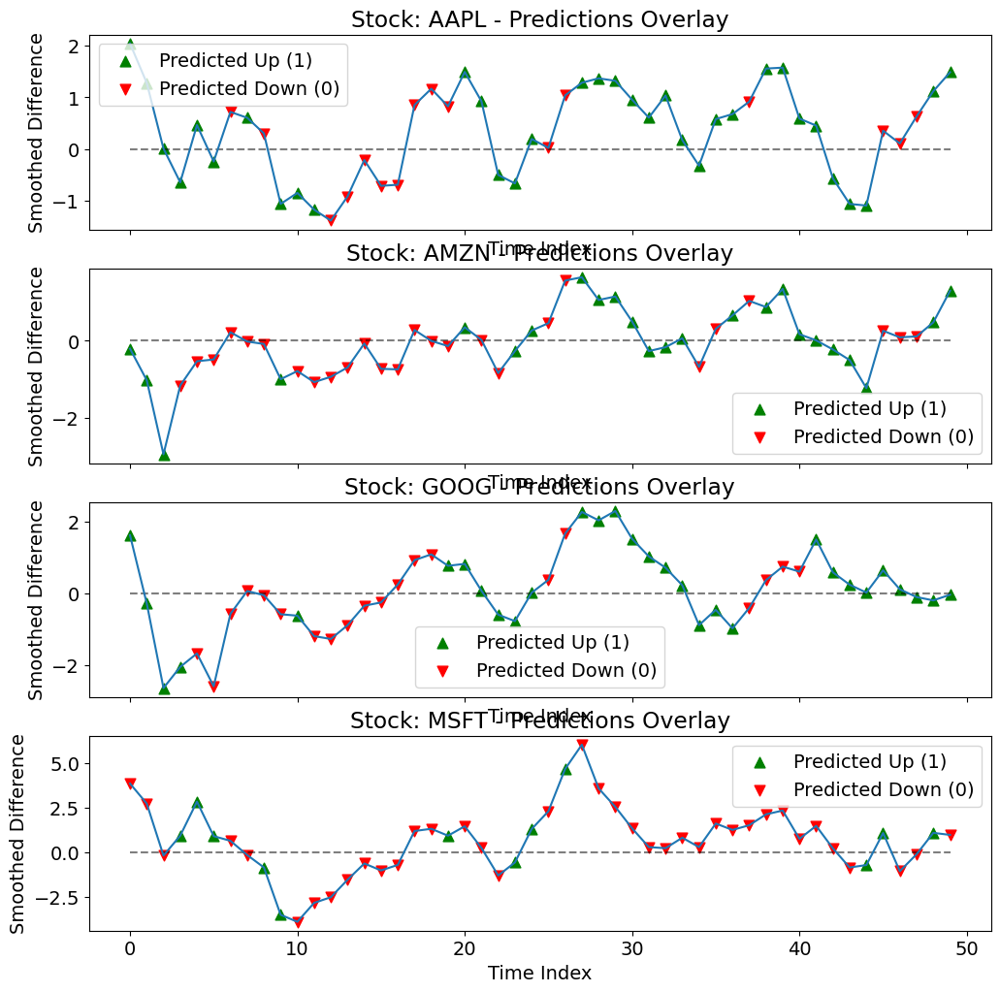

In [19]:
PLOT_NUM = 50

df_diff = pd.read_csv("smoothed_stock_differences.csv")

df_diff = df_diff.iloc[len(df_diff)-len(df_pred):].reset_index(drop=True)
df_diff.drop(columns=['Unnamed: 0'], inplace=True)

df_pred.columns = df_diff.columns # now they have the same column names

fig, axes = plt.subplots(len(df_diff.columns), 1, figsize=(12, 3 * len(df_diff.columns)), sharex=True)

df_plot = df_diff[:PLOT_NUM]
pred_plot = df_pred[:PLOT_NUM]

for i in range(len(axes)):
    ax = axes[i]

    series_data = df_plot.iloc[:, i]
    series_pred = pred_plot.iloc[:, i]

    up_points = series_data[series_pred == 1]
    down_points = series_data[series_pred == 0]
    
    ax.plot(series_data.index, [0]*len(series_data), 'k--', alpha=0.5)
    ax.plot(series_data.index, series_data)
    ax.scatter(up_points.index, up_points, 
            label='Predicted Up (1)', 
            color='green', 
            marker='^', 
            s=60)

    ax.scatter(down_points.index, down_points, 
            label='Predicted Down (0)', 
            color='red', 
            marker='v', 
            s=60)
    
    ax.set_title(f'Stock: {df_plot.columns[i]} - Predictions Overlay')
    ax.set_xlabel('Time Index')
    ax.set_ylabel('Smoothed Difference')
    ax.legend()

fig.show()

### 7.4 Profit Analysis
Accuracy and recall are great, but the most relevant metric in the financial world is profit. We apply our model's predictions to either go long (buy) or short (sell) the stock over the entirety of the test set. We then compare this method to the buy & hold strategy, which simply means we buy the stock at the beginning and then do nothing. This tests if our model beats the market or not.

In [20]:
df_actual = pd.read_csv('stock_prices.csv')
df_actual = df_actual.iloc[4:-3, 1:].reset_index(drop=True) #Remove date column, row changes from taking diff & moving average
df_actual = df_actual.iloc[len(df_actual)-len(df_pred):].reset_index(drop=True)

--- Portfolio Setup ---
Total Capital: $1,000.00
Stocks: 4
Allocation: $250.00 per stock

Stock 0: Profit $407.02 | Final: $657.02
Stock 1: Profit $1,044.87 | Final: $1,294.87
Stock 2: Profit $785.44 | Final: $1,035.44
Stock 3: Profit $-39.70 | Final: $210.30


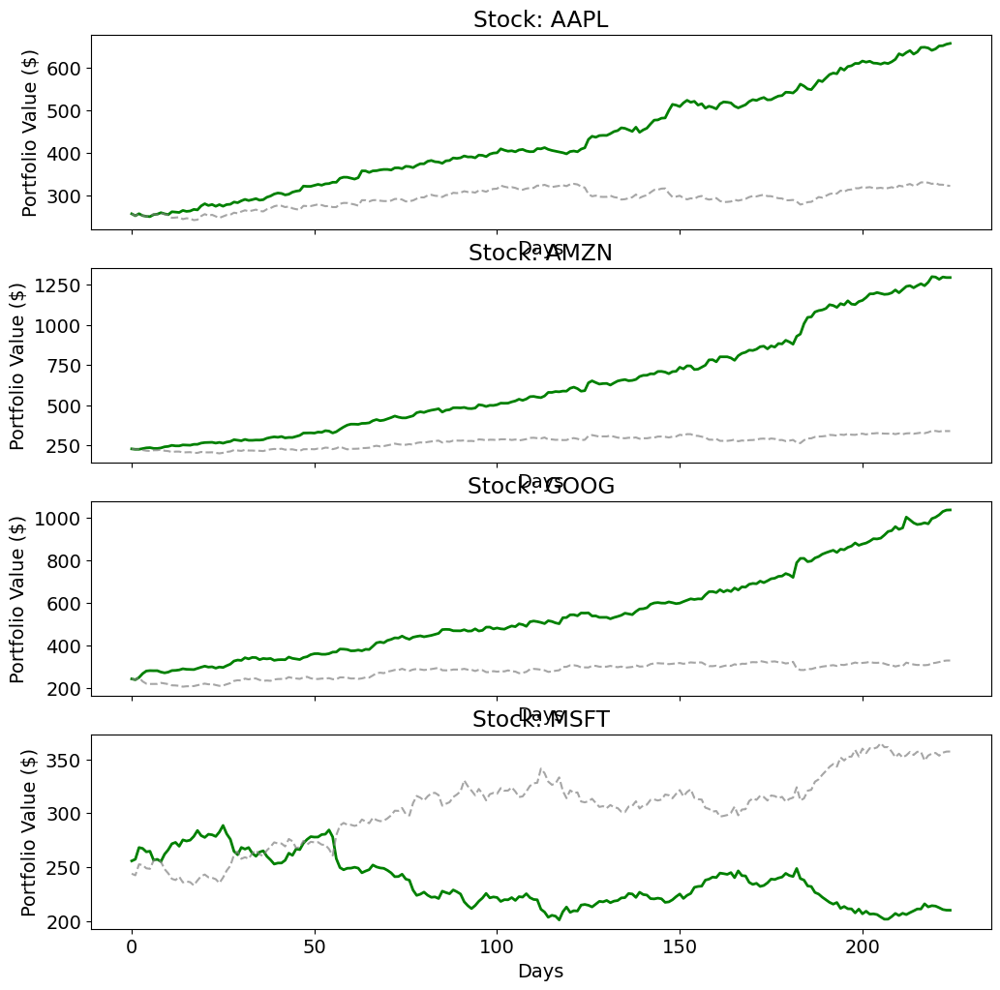

In [21]:
initial_capital = 1000

# Dimensions
num_timesteps, num_stocks = df_pred.shape

# Allocate Capital (Equal Weighting)
capital_per_stock = initial_capital / num_stocks

print(f"--- Portfolio Setup ---")
print(f"Total Capital: ${initial_capital:,.2f}")
print(f"Stocks: {num_stocks}")
print(f"Allocation: ${capital_per_stock:,.2f} per stock\n")

# Store individual stock results to sum up later
# We initialize total_wealth_curve with 0s to accumulate daily values
# Note: Length is len(actuals) - 1 because returns are calculated on diffs
total_wealth_curve = np.zeros(num_timesteps - 1) 
market_wealth_curve = np.zeros(num_timesteps - 1)

stock_performance = []

fig, axes = plt.subplots(len(df_pred.columns), 1, figsize=(12, 3 * len(df_diff.columns)), sharex=True)

# Loop over each stock (column)
for i in range(num_stocks):
    
    # Extract columns for this specific stock
    p_col = np.array(df_pred.iloc[1:, i])
    a_col = np.array(df_actual.iloc[:, i])
    
    # Calculate Returns
    # (Price_t+1 - Price_t) / Price_t
    daily_returns = np.diff(a_col) / a_col[:-1]
    
    # Generate Signals
    signals = 2 * p_col - 1 #1's unchanged, 0 -> -1
        
    # Calculate Strategy Returns for this Stock
    strategy_returns = signals * daily_returns
    
    # Wealth over time for this specific stock
    # Start with capital_per_stock, multiply by cumulative returns
    stock_wealth = capital_per_stock * np.cumprod(1 + strategy_returns)
    
    # Buy & Hold Benchmark for this stock
    bnh_wealth = capital_per_stock * np.cumprod(1 + daily_returns)
    
    # Add to the Portfolio Totals
    total_wealth_curve += stock_wealth
    market_wealth_curve += bnh_wealth
    
    # Calculate final stats for this stock
    final_val = stock_wealth[-1]
    profit = final_val - capital_per_stock
    stock_performance.append({
        'Stock_ID': i,
        'Profit': profit,
        'Final_Value': final_val
    })
    
    print(f"Stock {i}: Profit ${profit:,.2f} | Final: ${final_val:,.2f}")

    axes[i].plot(stock_wealth, label='CQNN Portfolio Strategy', color='green', linewidth=2)
    axes[i].plot(bnh_wealth, label='Buy & Hold (Market)', color='gray', linestyle='--', alpha=0.7)
    axes[i].set_title(f'Stock: {df_pred.columns[i]}')
    axes[i].set_xlabel('Days')
    axes[i].set_ylabel('Portfolio Value ($)')

fig.show()


--- Grand Totals ---
Final Portfolio Value: $3,197.64
Total Net Profit:      $2,197.64
ROI:                   219.76%
vs Buy-and-Hold:       $1,346.76 (Diff: $1,850.88)


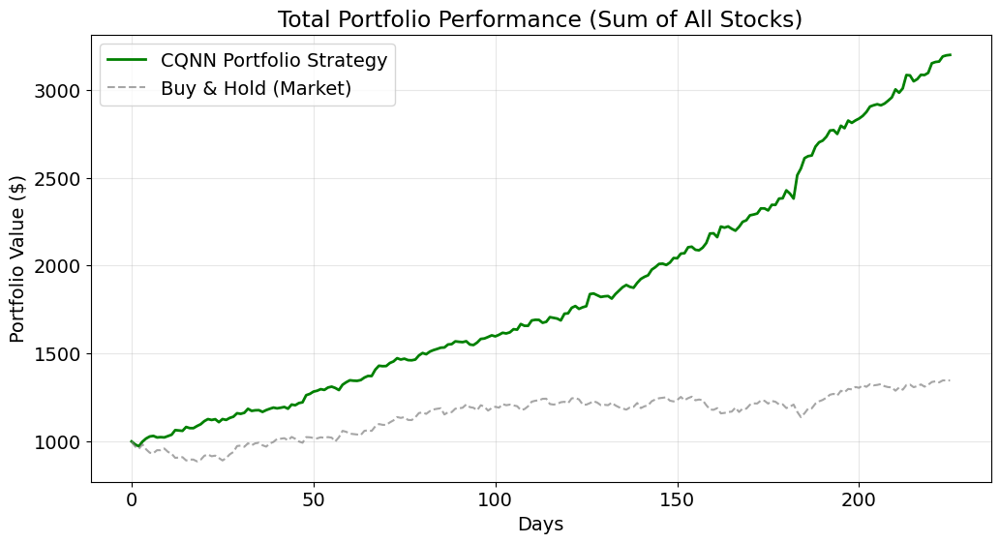

In [22]:

# Final Portfolio Aggregations
grand_total_value = total_wealth_curve[-1]
grand_total_profit = grand_total_value - initial_capital

market_final_value = market_wealth_curve[-1]
market_profit = market_final_value - initial_capital

print(f"\n--- Grand Totals ---")
print(f"Final Portfolio Value: ${grand_total_value:,.2f}")
print(f"Total Net Profit:      ${grand_total_profit:,.2f}")
print(f"ROI:                   {(grand_total_profit/initial_capital)*100:.2f}%")
print(f"vs Buy-and-Hold:       ${market_final_value:,.2f} (Diff: ${grand_total_value - market_final_value:,.2f})")

# 5. Plot Total Portfolio Performance
plt.figure(figsize=(12, 6))

# Add initial capital to the start of the curve for plotting 
plot_curve = np.concatenate(([initial_capital], total_wealth_curve))
market_curve = np.concatenate(([initial_capital], market_wealth_curve))

plt.plot(plot_curve, label='CQNN Portfolio Strategy', color='green', linewidth=2)
plt.plot(market_curve, label='Buy & Hold (Market)', color='gray', linestyle='--', alpha=0.7)

plt.title('Total Portfolio Performance (Sum of All Stocks)')
plt.ylabel('Portfolio Value ($)')
plt.xlabel('Days')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

As can be seen, our method demonstrated a 220% return on investment while the buy & hold strategy (the control) only demonstrated a 35% ROI.

---

## 8. Discussion

### 8.1 Interpretation of Results
When interpreting performance metrics of financial forecasting models, our expectations must be very different than standard ML models. A summary of metrics which indicate poor, actionable, and suspicious models is detailed in the table below:

| Metric    | Poor (Random) | Good (Actionable) | Great (Profitable) | Suspicious (Overfit) |
|-----------|---------------|-------------------|--------------------|----------------------|
| Accuracy  | 50%           | 53-55%            | 55-58%             | >60%                 |
| Recall    | Varies widely | >40%              | >55%               | >80%                 |
| MCC       | 0.00          | 0.02-0.05         | 0.05-0.15          | >0.20                |

Although a naive model that simply predicts up every day would achieve an accuracy of 53% (because of general stock market increase), this model would also have a MCC of 0.00, meaning it is easy to determine its flaw. An algorithmic model which predicts both up and down frequently but produces an accuracy of 53% is considered an actionable model.  
As can be seen from the table above, all three performance metrics from our model fall within the profitable range. This is great news, as it means our model is highly effective, in fact at the cutting edge of financial models. However, reproducing these results turns out to be quite difficult, as is discussed in the next section.

### 8.2 Convergence of Solutions
An interesting phenomenon occurs when we re-train the model many times. This experimentation was done during the creation of the notebook and converting from a local environment to OSC but is not shown. Sometimes, we get a model that performs very well on the test set, and sometimes we get one that significantly underperforms, in the 20-30% accuracy range. This occurs because we initialize our parameters completely randomly, meaning our system easily converges to different solutions depending only on the initial parameters. Figuring out which solutions converge and where they lie in the parameter-space is actually an active area of research in quantum computation. One phenomena observed is the overlap gap property, in which local minima are either very similar or completely different, meaning that it is difficult to bridge one island of solutions to another. Thus the solution which is converged to, even if it isn't an absolute minima, is highly dependent on initial conditions. Although the model we produced in this notebook was not cherry-picked (it was actually the first one I ran on the OSC environment), we do suspect that it may be overfit because it is hard to reproduce and its performance metrics are on the verge of indicating an overfit model.

### 8.3 Limitations
In our model, we only utilized data from 2018-2023, which means we have 1,825 data points to work with (before smoothing). Relatively, this is a small amount of data in the ML world. However, using data from an earlier time period might give inaccurate data since the economy changes over time. Predicting the stock market in 1980 is completely different than predicting it today since the global economy has completely changed. This is one of the great challenges of the financial market, as it is ever-changing and data is limited.  
Additionally, we only sorted the data into 2 bins: up or down. However, this does not emphasize the extent of the increase or decrease, which can significantly impact the obtainable profit by using this model for more than just buying/shorting.  
We only used 2 share/specify layers in our model, for training efficiency. We should expect more layers to perform better, although too many parameters would risk overfitting the data. It would be interesting to experiment with the training layers to determine the best model.

## 9. Conclusions & Future Work

### 9.1 Summary

This project explored the application of quantum machine learning to financial forecasting by implementing and evaluating a Contextual Quantum Neural Network (CQNN). Our primary objective was to leverage the potential of QML to model the complex, non-linear dynamics of stock market data more effectively than classical methods. To achieve this, we replicated the Quantum Multi-Task Learning architecture proposed by Mourya et al. (2025), utilizing a share-and-specify ansatz to simultaneously predict price distributions for multiple assets. The implementation successfully integrated the quantum circuit with the QBGU training technique, expediting the training process. We executed parameter update by calculating fidelity loss and using SPSA. Our methodology was able to successfully produce what should be a robust model in the financial market. However, our experimental analysis highlighted significant challenges in the optimization process, because the same method was also able to produce both underfit and overfit solutions. We observed that the loss-parameter space exhibits a rugged landscape, which prevented the model from consistently converging to a global solution. In summary, the QMTL architecture is sometimes successful but requires more experimentation to determine if it can be applied to real markets.

### 9.2 Future Work

It is clear that while this training methodology has its flaws, it shows promising results. Given more time, team members, and computational resources, it would be extremely interesting to experiment with several factors to examine accuracy, extent, and robustness of the model:

* **Share/Specify Layers**: Varying the number of share/specify ansatz layers would be interesting to see how they affect performance. The current hypothesis is that increasing the number of layers would first improve accuracy, but eventually test accuracy would decrease due to overfitting.
* **Learning Rate**: Currently, the learning rate is fixed at 0.01. Unlike classical ML, where loss-parameter space is usually smooth, in quantum ML, the loss-parameter space is rugged, mostly due to the stochastic nature of the process, as can be seen by the rugged nature of our loss vs. epoch curves. This indicates that the converge on a particular solution can be heavily influenced by the learning rate. It would be interesting to see how a scheduler, which changes the learning rate during training, would manipulate performance of the model
* **Hyperparameters**: Two of our hyperparameters are specified above: share/specify layers and learning rate. Other hyperparameters are patience, the loss improvement required to update patience, and more. We could utilize the validation set to modify these hyperparameters with a tuner.
* **Overlap Gap Property**: Our random initialization for each training means that we are likely to reach a different convergent solution every time, due to the rugged landscape of the loss-parameter space. Currently, we are using a normal distribution to intialize our parameters, although I feel like a uniform distribution between $[-\pi, \pi]$ or $[0, 2\pi]$ would be more beneficial to the model. Experimenting with the initialization procedure would be interesting, as well as investigating whether this problem exhibits the overlap gap property, an area of current research.
* **Optimizer**: Currently, we are using the Adam optimizer and interfacing with PennyLane through PyTorch during our parameter update step. There is a chance that all of this backend communication creates a mess that is not truly using the SPSA algorithm. A more robust approach would be to use qml.SPSAOptimizer straight out of the PennyLane library. However, this proved difficult when first creating this project and would require more time and effort to get right.
* **Number of Bins**: Currently, we are predicting whether a stock price will go up or down. However, we could use a bin number that is any power of 2 (based on the number of output qubits). For example, four bins would indicate large increase, small increase, small decrease, and large decrease in the stock price day-by-day. It would be interesting to examine how the accuracy of the model changes when we increase the "resolution" of our predictions by increasing the bin number. We should expect a decrease in accuracy, but the tradeoff is that the financial return from each bin could drastically change the expected profit.
* **Number & Choice of Stocks**: We are currently training and predicting our data on four stocks, all within the top stocks of the S&P 500, and more specifically within the Magnificent Seven. Since these stocks are in the same echelon, their stock pricing generally performs similarly. It would be interesting to see whether our model would perform as well on more obscure stocks. We could also examine how the number of stocks affects performance of the model. Though more stocks means more data, meaning the model should be better, we also don't know how this would affect our Multi-Task learning architecture, which attempts to learn the behavior of every stock at once. It it is very likely that increasing the number of stocks could damage the model's performance.
* **Running on Quantum Hardware**: We have performed all computations in this notebook using a simulator. However, if we wanted to truly utilize quantum advantage, we would have to use actual quantum hardware. However, running on real quantum hardware costs money, and this project does not have the resources to do so. Given more financial resources, it would be a beneficial proof-of-concept to ensure this methodology also works on hardware. All processes would take significantly longer because we must run each sample for generally ~1000 shots to determine probabilities. This probabilistic behavior, as well as inherent noise in current quantum computers would make our data much noisier, most likely reducing accuracy. I am also interested to see if our Quantum Neural Network (QNN) can function as a Bayesian Neural Network (BNN).